# Understanding the modal shifting and travel delays under short-term transport disruption – a case study of London tube strike

In [1]:
import os
import pandas as pd
import numpy as np
from datetime import datetime
import geopandas as gpd
import matplotlib.pyplot as plt
from defined_methods import merge_csv, merge_csv_flow

# Data preparation

(500648.6269499996, 564876.9020499996, 153596.6433500004, 203188.04565000077)

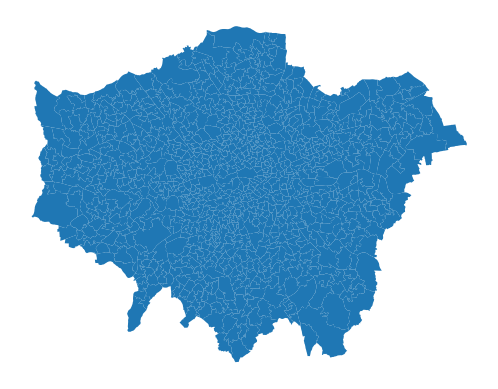

In [217]:
# read the administrative relationship encoding file
admin_rel = pd.read_csv(
    '/Users/zonghe/Library/CloudStorage/OneDrive-UnitedNationsDevelopmentProgramme/Paper/Tube Strike Behaviour/oa_lsoa_msoa_la_trans.csv')

# read the spatial administrative boundary files
oa = gpd.read_file(
    '/Users/zonghe/Library/CloudStorage/OneDrive-UnitedNationsDevelopmentProgramme/Paper/Tube Strike Behaviour/lon_oa.gpkg')
# lsoa = gpd.read_file(
#     '/Users/zonghe/Library/CloudStorage/OneDrive-UnitedNationsDevelopmentProgramme/Paper/Tube Strike Behaviour/lon_lsoa.gpkg')
msoa = gpd.read_file(
    '/Users/zonghe/Library/CloudStorage/OneDrive-UnitedNationsDevelopmentProgramme/Paper/Tube Strike Behaviour/lon_msoa.gpkg')

inoutter = '/Users/zonghe/Library/CloudStorage/OneDrive-UniversityCollegeLondon/Zonghe Ma/Zonghe Ma-STA-Investigating the relationship between modal shifting and road transport resilience under Tube strikes/Raw data/London administrative boundaries/lp-consultation-oct-2009-inner-outer-london-shp/lp-consultation-oct-2009-inner-outer-london.shp'
inoutter = gpd.read_file(inoutter)
inoutter.to_crs(epsg=27700, inplace=True)
msoa = msoa.explode(index_parts=True).reset_index(drop=True)


msoa_joined = gpd.sjoin(msoa, inoutter[['Boundary', 'geometry']], how='inner', predicate='intersects')

msoa_joined.rename(columns={'Boundary': 'inout'}, inplace=True)

# Calculate intersection area for each row in the joined DataFrame
msoa_joined['intersection_area'] = msoa_joined.apply(
    lambda row: row.geometry.intersection(inoutter.loc[row.index_right].geometry).area,
    axis=1
)
msoa_joined.drop(columns=['index_right'], inplace=True)


# Group by MSOA code, and keep the record with the largest intersection area within each group
msoa_filtered = msoa_joined.sort_values('intersection_area', ascending=False).drop_duplicates(subset=['msoa21cd'])
# Merge the filtered results back with the original MSOA DataFrame to include the 'Boundary' tags
msoa = pd.merge(msoa, msoa_filtered[['msoa21cd', 'inout']], on='msoa21cd', how='left')

msoa = msoa.drop([63,74,934])
msoa.plot()
plt.axis('off')

In [219]:
# Check the geometry types in the GeoDataFrame
geometry_types = msoa.geometry.type

# Find if there are any MultiPolygons
has_multipolygons = 'MultiPolygon' in geometry_types.unique()

print("Contains MultiPolygon geometries:", has_multipolygons)

# If you want to count how many MultiPolygons there are:
multipolygon_count = (geometry_types == 'MultiPolygon').sum()
print("Number of MultiPolygon geometries:", multipolygon_count)

# Optionally, to get the indices or identifiers of features with MultiPolygon geometries:
multipolygon_indices = msoa[geometry_types == 'MultiPolygon'].index
print("Indices of MultiPolygon geometries:", multipolygon_indices.tolist())

# Or, if your GeoDataFrame has an identifier column, e.g., 'msoa11cd':
if 'msoa11cd' in msoa.columns and has_multipolygons:
    multipolygon_ids = msoa.loc[geometry_types == 'MultiPolygon', 'msoa11cd']
    print("IDs of MultiPolygon geometries:", multipolygon_ids.tolist())


Contains MultiPolygon geometries: False
Number of MultiPolygon geometries: 0
Indices of MultiPolygon geometries: []


## Behavioural data

In [4]:
device = merge_csv(
    '/Users/zonghe/Library/CloudStorage/OneDrive-UnitedNationsDevelopmentProgramme/Paper/Tube Strike Behaviour/travel_info_oa/device')
stay_time = merge_csv(
    '/Users/zonghe/Library/CloudStorage/OneDrive-UnitedNationsDevelopmentProgramme/Paper/Tube Strike Behaviour/travel_info_oa/stay time')
travel_time = merge_csv(
    '/Users/zonghe/Library/CloudStorage/OneDrive-UnitedNationsDevelopmentProgramme/Paper/Tube Strike Behaviour/travel_info_oa/travel time')
# drop the na values in the stay time dataset
stay_time = stay_time.dropna()
# convert the stay time from seconds to hours
stay_time['stay_time'] = stay_time['stay_time'].astype(int) / 3600

# Filtering for March 1, 2022, and March 3, 2022

device_313 = device[(device['date'] == '02/22/22') | (device['date'] == '03/01/22') | (
        device['date'] == '03/03/22')].copy().reset_index(drop=True)
device_313['date'] = pd.to_datetime(device_313['date'], format='%m/%d/%y').dt.strftime('%m/%d/%y')

stay_time_313 = stay_time[(stay_time['date'] == '02/22/22') | (stay_time['date'] == '03/01/22') | (
        stay_time['date'] == '03/03/22')].copy().reset_index(
    drop=True)
stay_time_313['date'] = pd.to_datetime(stay_time_313['date'], format='%m/%d/%y').dt.strftime('%m/%d/%y')

travel_time_313 = travel_time[
    (travel_time['date'] == '02/22/22') | (travel_time['date'] == '03/01/22') | (
            travel_time['date'] == '03/03/22')].copy().reset_index(drop=True)
travel_time_313['date'] = pd.to_datetime(travel_time_313['date'], format='%m/%d/%y').dt.strftime('%m/%d/%y')

### Behavioural data processing

In [5]:
device_313_status = pd.merge(device_313, stay_time_313, on=['startid', 'date', 'oa21cd', 'device_type'], how='left')
device_313_status = device_313_status.drop_duplicates().reset_index(drop=True)

# insert the MSOA and LSOA column from 'admin_rel'
device_313_status = pd.merge(device_313_status, admin_rel[['oa21cd', 'msoa21cd', 'lsoa21cd']], on=['oa21cd'],
                             how='left')
device_313_status = device_313_status.drop_duplicates().reset_index(drop=True)

device_313_modes = travel_time_313.groupby(['stripid', 'startid', 'date', 'update_mode']).agg(
    {'time': 'sum', 'distance': 'sum'}).reset_index()

# MSOA construction

## MSOA indicators

In [6]:
# merge dfs to aggrate at MSOA level
device_313_merged = pd.merge(device_313_status, device_313_modes, on=['date', 'startid'], how='left')
# device_313_merged.drop_duplicates(inplace=True)
# device_313_merged

In [7]:
# drop duplicates
counts = device_313_merged.groupby(['date', 'msoa21cd', 'device_type', 'update_mode']).size().reset_index(name='count')

counts = counts.pivot_table(index=['date', 'msoa21cd', 'update_mode'], columns='device_type', values='count',
                            fill_value=0).reset_index()
counts.columns = [col if col in ['date', 'msoa21cd', 'update_mode'] else f"{col}_count" for col in counts.columns]
# counts

counts_total = counts.groupby(['date', 'update_mode']).agg({'resident_count': 'sum', 'attraction_count': 'sum',
                                                            'passthrough_count': 'sum'}).reset_index()
counts_total

,date,update_mode,resident_count,attraction_count,passthrough_count
0,02/22/22,bus,14575,31753,596057
1,02/22/22,car,127097,278289,5914911
2,02/22/22,cycle,7906,17419,388011
3,02/22/22,stationary,271918,524195,8618519
4,02/22/22,train,3808,11533,268144
5,02/22/22,tube,7074,17848,552658
6,02/22/22,walks,129094,283211,3928162
7,03/01/22,bus,13814,29276,607542
8,03/01/22,car,122137,259339,5963189
9,03/01/22,cycle,9489,20266,563545


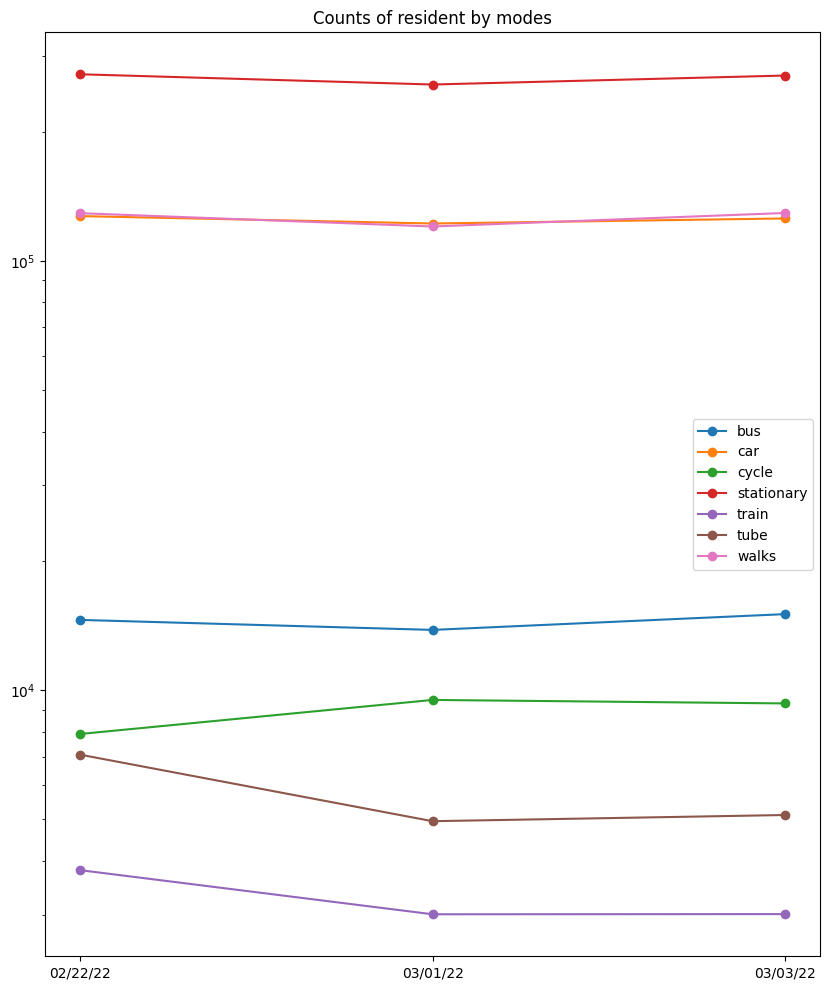

In [8]:
plt.figure(figsize=(10, 12))

# devide the groups by the update mode


for update_mode in counts_total['update_mode'].unique():
    plt.plot(counts_total[counts_total['update_mode'] == update_mode]['date'],
             (counts_total[counts_total['update_mode'] == update_mode]['resident_count']), label=f'{update_mode}',
             marker='o')

plt.yscale('log')
plt.title('Counts of resident by modes')
plt.legend()
plt.show()


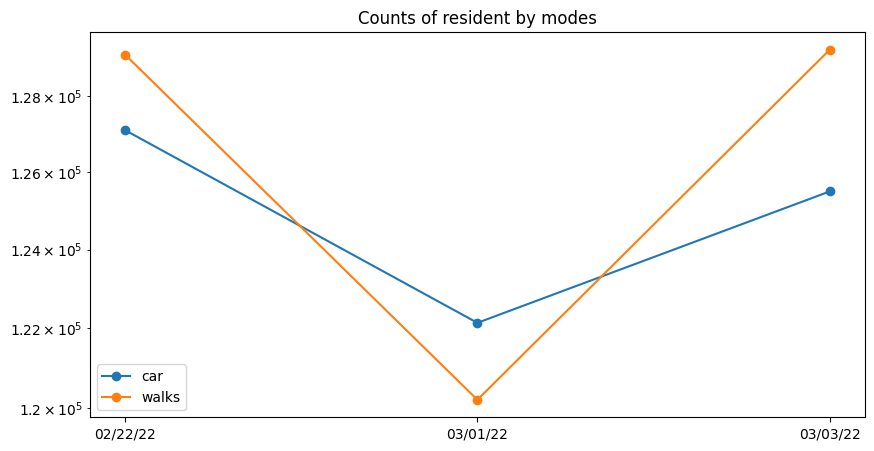

In [9]:
plt.figure(figsize=(10, 5))

# devide the groups by the update mode


plt.plot(counts_total[counts_total['update_mode'] == 'car']['date'],
         (counts_total[counts_total['update_mode'] == 'car']['resident_count']), label='car',
         marker='o')
plt.plot(counts_total[counts_total['update_mode'] == 'walks']['date'],
         (counts_total[counts_total['update_mode'] == 'walks']['resident_count']), label='walks',
         marker='o')
plt.yscale('log')
plt.title('Counts of resident by modes')
plt.legend()
plt.show()


In [10]:
# The units of 'time' and 'distance' are hours and kilometers, respectively

# Group by 'date' and 'msoa21xd', and aggregate 'time' and 'distance' by sum
triptd = device_313_merged.groupby(['date', 'msoa21cd', 'device_type', 'update_mode']).agg(time_sum=('time', 'sum'),
                                                                                           distance_sum=(
                                                                                               'distance',
                                                                                               'sum')).reset_index()
triptd[['time_sum', 'distance_sum']] = triptd[['time_sum', 'distance_sum']].round(2)

# Calculating mean values and renaming columns
triptd['time_mean'] = device_313_merged.groupby(['date', 'msoa21cd', 'device_type', 'update_mode'])['time'].transform(
    'mean').round(2)
triptd['distance_mean'] = device_313_merged.groupby(['date', 'msoa21cd', 'device_type', 'update_mode'])[
    'distance'].transform(
    'mean').round(2)
triptd = triptd.pivot_table(index=['date', 'msoa21cd', 'update_mode'], columns='device_type',
                            values=['time_sum', 'time_mean', 'distance_sum', 'distance_mean'],
                            fill_value=0).reset_index()
triptd = triptd.rename_axis(None)
triptd.columns = [col if col in ['date', 'msoa21cd', 'update_mode'] else f"{col[0]}_{col[1]}" for col in triptd.columns]
triptd.rename(columns={'date_': 'date', 'msoa21cd_': 'msoa21cd', 'update_mode_': 'update_mode'}, inplace=True)
triptd_all = triptd.copy()

triptd = triptd[
    ['date', 'msoa21cd', 'update_mode', 'distance_sum_resident', 'distance_mean_resident', 'time_sum_resident',
     'time_mean_resident']]

triptd

,date,msoa21cd,update_mode,distance_sum_resident,distance_mean_resident,time_sum_resident,time_mean_resident
0,02/22/22,E02000001,bus,165.99,1.41,15.96,0.93
1,02/22/22,E02000001,car,4051.17,0.16,226.10,4.50
2,02/22/22,E02000001,cycle,65.45,1.41,4.43,0.93
3,02/22/22,E02000001,stationary,271.11,0.16,2276.60,4.50
4,02/22/22,E02000001,train,1107.77,1.41,31.70,0.93
...,...,...,...,...,...,...,...
21036,03/03/22,E02007115,cycle,29.25,1.31,3.81,0.72
21037,03/03/22,E02007115,stationary,86.45,0.15,1923.33,5.16
21038,03/03/22,E02007115,train,202.44,0.17,4.23,4.58
21039,03/03/22,E02007115,tube,88.96,0.20,5.99,4.81


In [ ]:
triptd_total = triptd.groupby(['date']).agg({'distance_sum_resident': 'sum', 'distance_mean_resident': 'mean',
                                             'time_sum_resident': 'sum', 'time_mean_resident': 'mean'}).reset_index()
# plot all column of triptd_total
plt.figure(figsize=(10, 10))
for col in triptd_total.columns:
    if col != 'date':
        plt.plot(triptd_total['date'], triptd_total[col], label=col, marker='o')

plt.yscale('log')
plt.title('Total distance and time by date')
plt.legend()
plt.show()

In [12]:
triptd_total_bymode = triptd.groupby(['date', 'update_mode']).agg(
    {'distance_sum_resident': 'sum', 'distance_mean_resident': 'mean',
     'time_sum_resident': 'sum', 'time_mean_resident': 'mean'}).reset_index()
triptd_total_bymode

,date,update_mode,distance_sum_resident,distance_mean_resident,time_sum_resident,time_mean_resident
0,02/22/22,bus,40507.74,3.313752,7720.52,2.677764
1,02/22/22,car,1298862.36,2.906367,136440.91,2.837894
2,02/22/22,cycle,36060.02,2.818713,5004.67,2.766567
3,02/22/22,stationary,49149.50,2.907794,1273862.96,2.874501
4,02/22/22,train,71914.96,2.489172,2313.43,2.302984
5,02/22/22,tube,71392.29,2.745609,3558.66,2.797834
6,02/22/22,walks,178992.59,3.363463,98546.20,2.667026
7,03/01/22,bus,35501.87,2.919910,6971.55,2.788683
8,03/01/22,car,1232088.83,3.149571,137497.23,2.767894
9,03/01/22,cycle,42706.87,3.012216,5991.71,2.766417


In [13]:
triprate_counts = device_313_merged.groupby(['date', 'msoa21cd', 'device_type', 'update_mode']).size().reset_index(
    name='count')
triprate_counts = triprate_counts[triprate_counts['device_type'] == 'resident']
triprate_counts = triprate_counts.pivot_table(index=['date', 'msoa21cd'], columns='update_mode', values='count',
                                              fill_value=0).reset_index()
triprate_counts = triprate_counts.rename_axis(None)
triprate_counts['public_transportation'] = triprate_counts['tube'] + triprate_counts['bus'] + triprate_counts['train']
triprate_counts['movement'] = triprate_counts['public_transportation'] + triprate_counts['car'] + triprate_counts[
    'cycle'] + triprate_counts['walks']

triprate_all = pd.DataFrame()
triprate_all['date'] = triprate_counts['date']
triprate_all['msoa21cd'] = triprate_counts['msoa21cd']
triprate_all['triprate'] = (
        triprate_counts['movement'] / (triprate_counts['movement'] + triprate_counts['stationary'])).round(4)
triprate_all['stationary_rate'] = (
        triprate_counts['stationary'] / (triprate_counts['movement'] + triprate_counts['stationary'])).round(4)

# triprate_all['tube_to_public'] = (triprate_counts['tube'] / triprate_counts['public_transportation'] ).round(4)
# triprate_all['bus_to_public'] = (triprate_counts['bus'] / triprate_counts['public_transportation'] ).round(4)
# triprate_all['train_to_public'] = (triprate_counts['train'] / triprate_counts['public_transportation'] ).round(4)

triprate_all['tube_to_movement'] = (triprate_counts['tube'] / triprate_counts['movement']).round(4)
triprate_all['car_to_movement'] = (triprate_counts['car'] / triprate_counts['movement']).round(4)
triprate_all['cycle_to_movement '] = (triprate_counts['cycle'] / triprate_counts['movement']).round(4)
triprate_all['walks_to_movement'] = (triprate_counts['walks'] / triprate_counts['movement']).round(4)
triprate_all['bus_to_movement'] = (triprate_counts['bus'] / triprate_counts['movement']).round(4)
triprate_all['train_to_movement'] = (triprate_counts['train'] / triprate_counts['movement']).round(4)
triprate_all['publictransportation_to_movement'] = (
        triprate_counts['public_transportation'] / triprate_counts['movement']).round(4)

triprate = triprate_all.copy()
triprate_all

,date,msoa21cd,triprate,stationary_rate,tube_to_movement,car_to_movement,cycle_to_movement,walks_to_movement,bus_to_movement,train_to_movement,publictransportation_to_movement
0,02/22/22,E02000001,0.5729,0.4271,0.0498,0.2979,0.0130,0.5385,0.0509,0.0498,0.1506
1,02/22/22,E02000002,0.5049,0.4951,0.0168,0.4471,0.0337,0.4231,0.0721,0.0072,0.0962
2,02/22/22,E02000003,0.5113,0.4887,0.0260,0.4922,0.0182,0.3958,0.0573,0.0104,0.0938
3,02/22/22,E02000004,0.5155,0.4845,0.0100,0.5075,0.0225,0.3950,0.0450,0.0200,0.0750
4,02/22/22,E02000005,0.4882,0.5118,0.0228,0.4615,0.0171,0.4501,0.0370,0.0114,0.0712
...,...,...,...,...,...,...,...,...,...,...,...
3001,03/03/22,E02007111,0.5550,0.4450,0.0388,0.3319,0.0345,0.5259,0.0474,0.0216,0.1078
3002,03/03/22,E02007112,0.4917,0.5083,0.0225,0.3371,0.0225,0.4944,0.1124,0.0112,0.1461
3003,03/03/22,E02007113,0.5192,0.4808,0.0123,0.3333,0.0247,0.5802,0.0494,0.0000,0.0617
3004,03/03/22,E02007114,0.5374,0.4626,0.0316,0.2595,0.0190,0.6266,0.0380,0.0253,0.0949


In [14]:
triprate.columns = triprate.columns.str.split('_').str[0]
triprate = triprate.melt(id_vars=['date', 'msoa21cd'], var_name='update_mode', value_name='value')
triprate.rename(columns={'value': 'triprate'}, inplace=True)
triprate

,date,msoa21cd,update_mode,triprate
0,02/22/22,E02000001,triprate,0.5729
1,02/22/22,E02000002,triprate,0.5049
2,02/22/22,E02000003,triprate,0.5113
3,02/22/22,E02000004,triprate,0.5155
4,02/22/22,E02000005,triprate,0.4882
...,...,...,...,...
27049,03/03/22,E02007111,publictransportation,0.1078
27050,03/03/22,E02007112,publictransportation,0.1461
27051,03/03/22,E02007113,publictransportation,0.0617
27052,03/03/22,E02007114,publictransportation,0.0949


In [15]:
triprate_total = pd.DataFrame()
triprate_counts_total = triprate_counts.groupby(['date']).agg({'movement': 'sum', 'stationary': 'sum',
                                                               'public_transportation': 'sum', 'tube': 'sum',
                                                               'bus': 'sum', 'train': 'sum',
                                                               'car': 'sum', 'cycle': 'sum',
                                                               'walks': 'sum'}).reset_index()
triprate_total['date'] = triprate_counts_total['date']

triprate_total['triprate'] = (triprate_counts_total['movement'] / (
        triprate_counts_total['movement'] + triprate_counts_total['stationary'])).round(4)
triprate_total['stationary_rate'] = (triprate_counts_total['stationary'] / (
        triprate_counts_total['movement'] + triprate_counts_total['stationary'])).round(4)

# triprate_total['tube_to_public'] = (triprate_counts_total['tube'] / triprate_counts_total['public_transportation'] ).round(4)
# triprate_total['bus_to_public'] = (triprate_counts_total['bus'] / triprate_counts_total['public_transportation'] ).round(4)
# triprate_total['train_to_public'] = (triprate_counts_total['train'] / triprate_counts_total['public_transportation'] ).round(4)

triprate_total['tube_to_movement'] = (triprate_counts_total['tube'] / triprate_counts_total['movement']).round(4)
triprate_total['car_to_movement'] = (triprate_counts_total['car'] / triprate_counts_total['movement']).round(4)
triprate_total['cycle_to_movement '] = (triprate_counts_total['cycle'] / triprate_counts_total['movement']).round(4)
triprate_total['walks_to_movement'] = (triprate_counts_total['walks'] / triprate_counts_total['movement']).round(4)
triprate_total['bus_to_movement'] = (triprate_counts_total['bus'] / triprate_counts_total['movement']).round(4)
triprate_total['train_to_movement'] = (triprate_counts_total['train'] / triprate_counts_total['movement']).round(4)
triprate_total['publictransportation_to_movement'] = (
        triprate_counts_total['public_transportation'] / triprate_counts_total['movement']).round(4)

triprate_total

,date,triprate,stationary_rate,tube_to_movement,car_to_movement,cycle_to_movement,walks_to_movement,bus_to_movement,train_to_movement,publictransportation_to_movement
0,02/22/22,0.5157,0.4843,0.0244,0.4389,0.0273,0.4458,0.0503,0.0132,0.0879
1,03/01/22,0.5153,0.4847,0.0181,0.4464,0.0347,0.4394,0.0505,0.0110,0.0796
2,03/03/22,0.5154,0.4846,0.0178,0.4370,0.0324,0.4500,0.0523,0.0105,0.0806


In [220]:
# merge all indicators to one dataframe with geometry
map_msoa = pd.merge(counts, triptd, on=['date', 'msoa21cd', 'update_mode'], how='left')
map_msoa = pd.merge(map_msoa, triprate, on=['date', 'msoa21cd', 'update_mode'], how='left')
map_msoa = pd.merge(map_msoa, msoa[['msoa21cd', 'msoa21nm', 'inout', 'geometry']], on=['msoa21cd'], how='left')

map_msoa.drop_duplicates(['date', 'msoa21cd', 'update_mode', 'geometry'], inplace=True)

map_msoa = gpd.GeoDataFrame(map_msoa, geometry='geometry', crs='EPSG:27700')


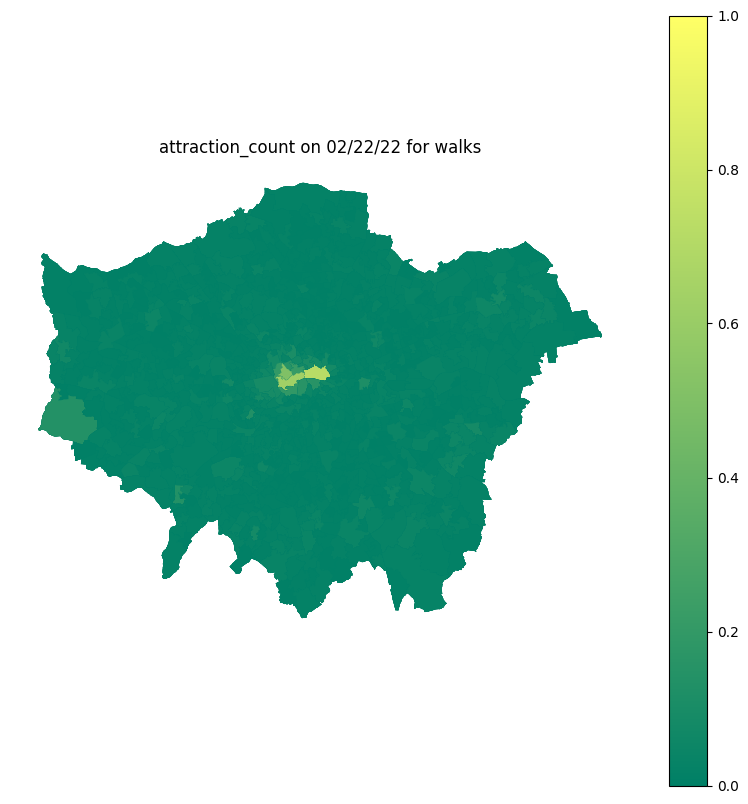

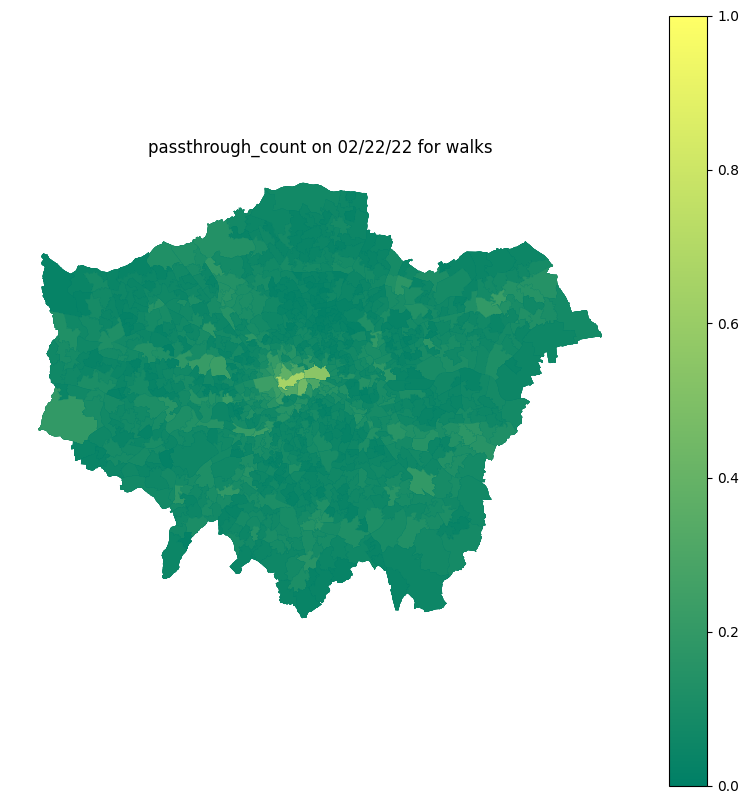

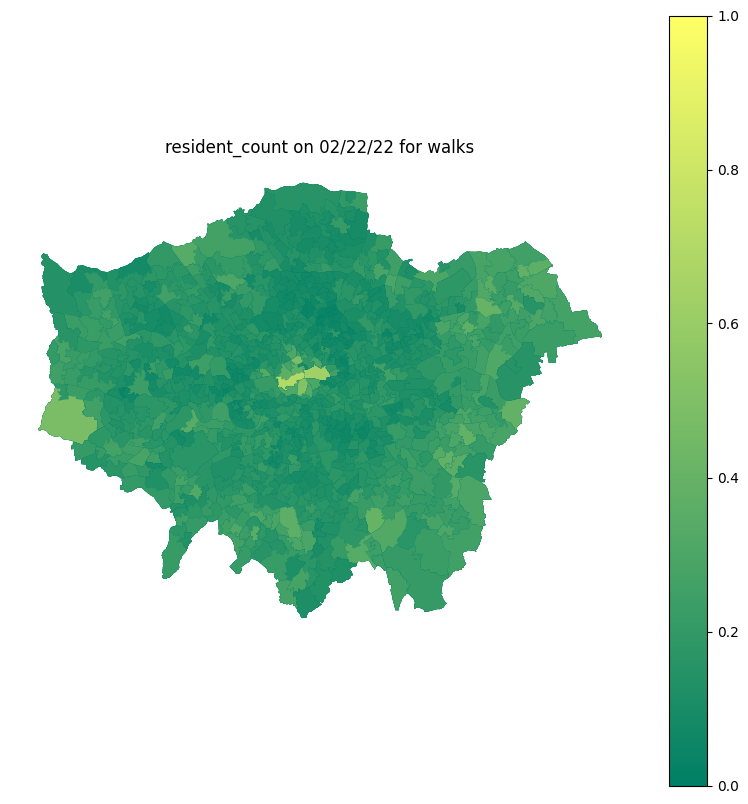

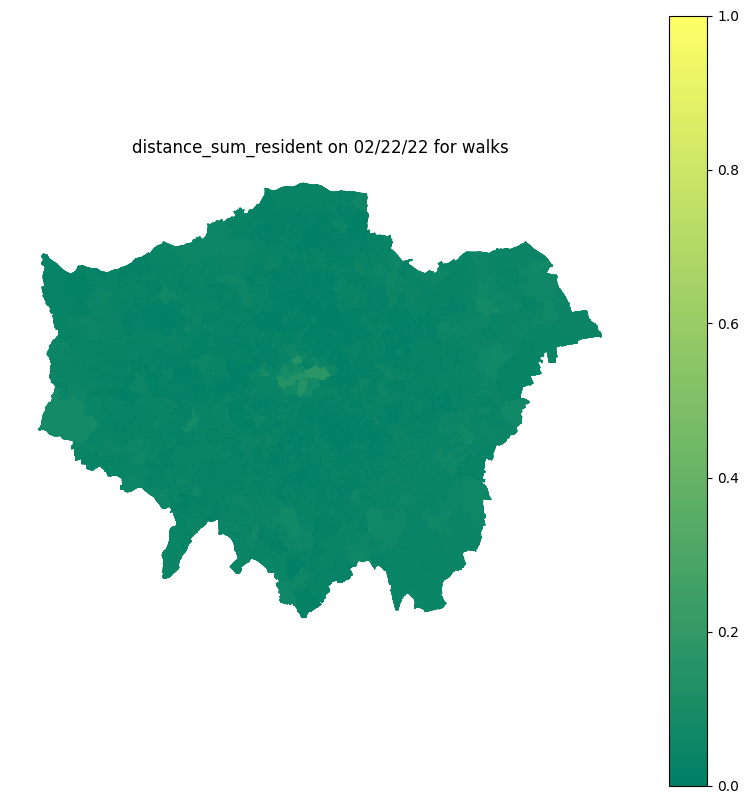

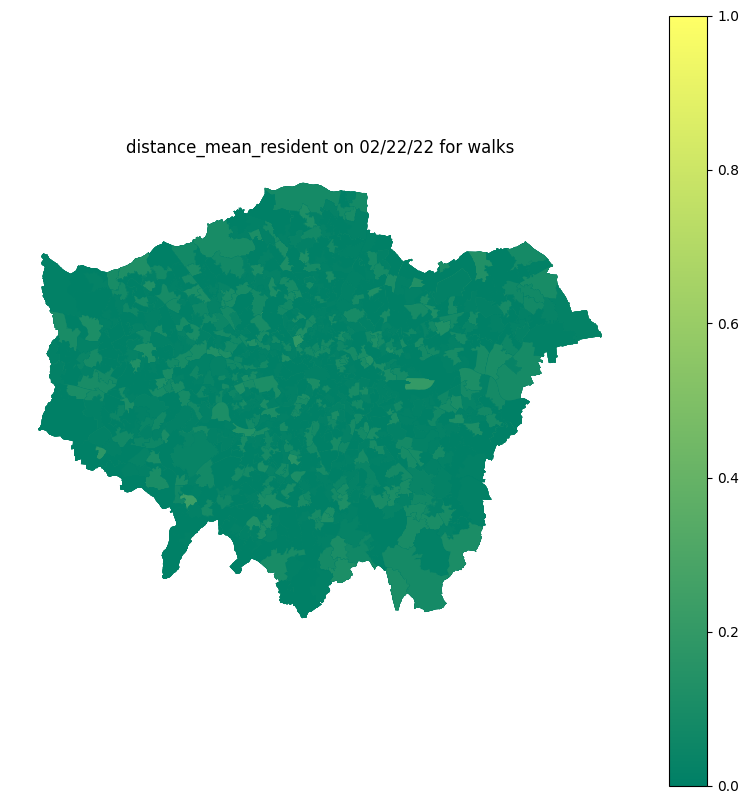

...

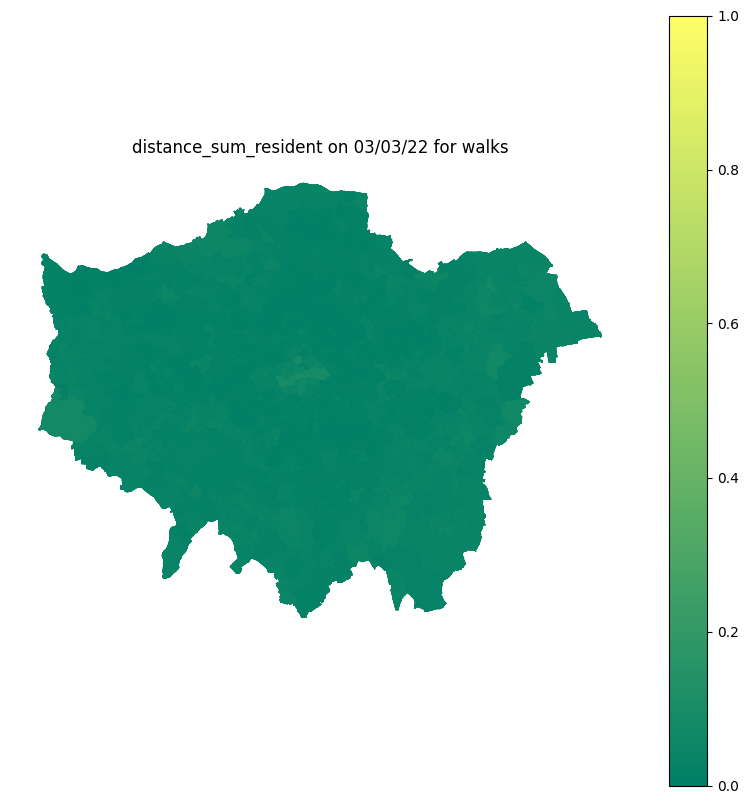

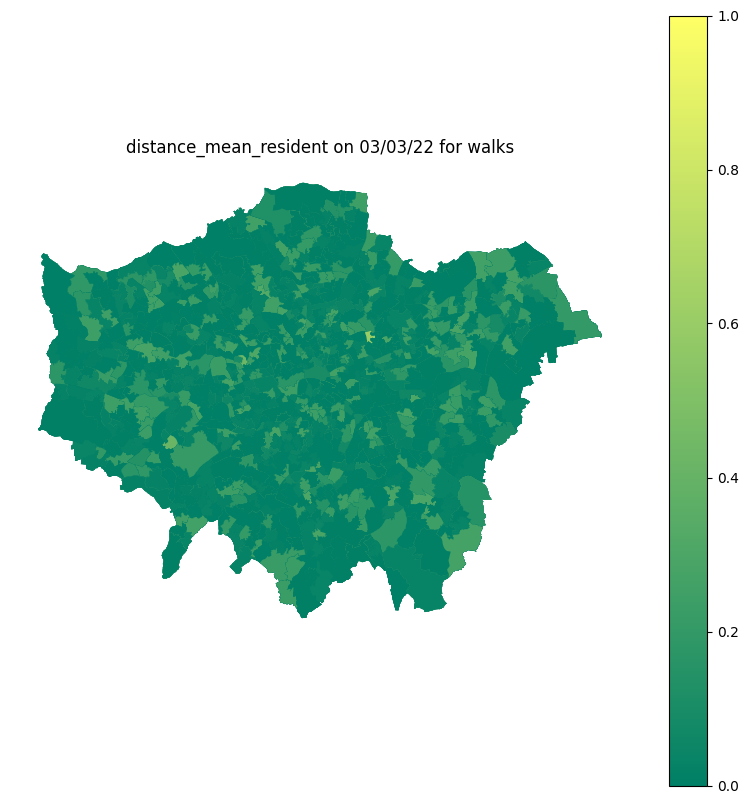

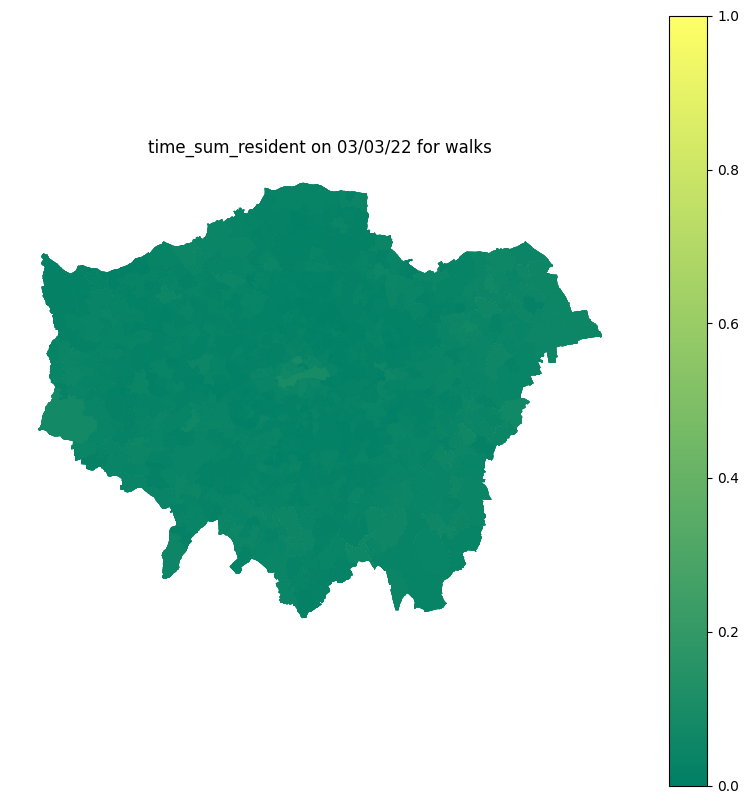

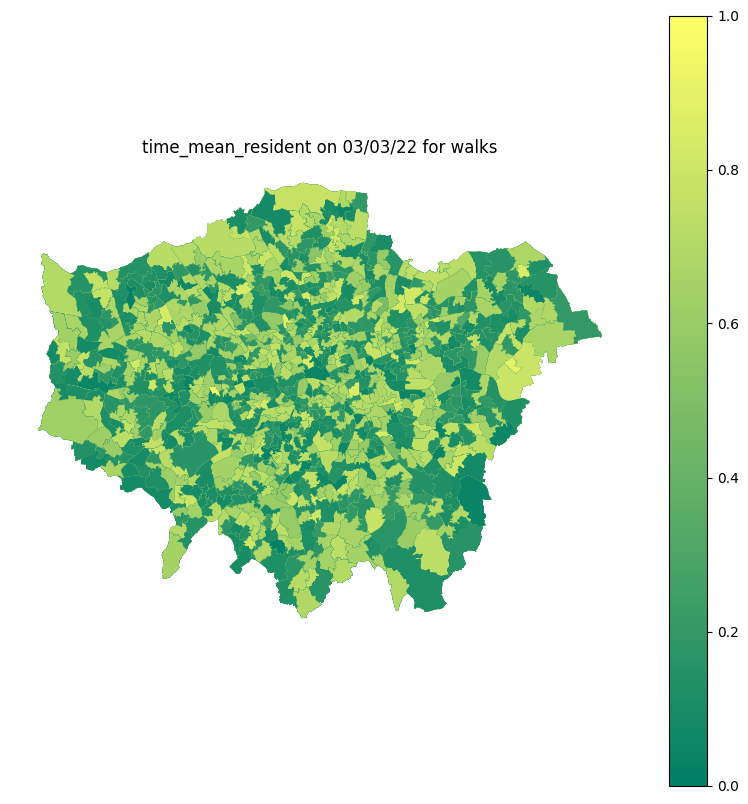

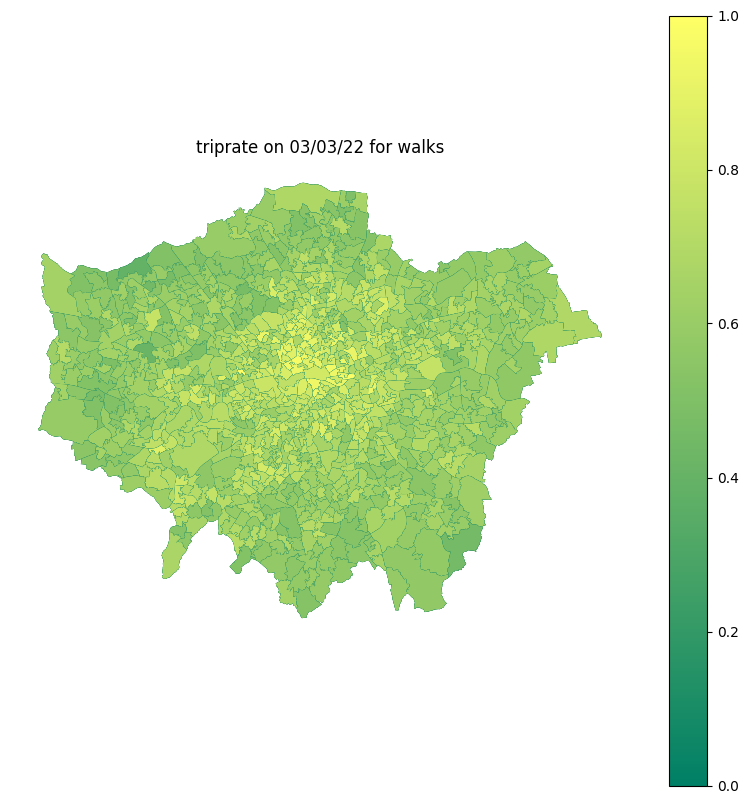

In [51]:
def normalize_plot(gdf, column, date, cmap='summer', legend=True):
    # Filter the GeoDataFrame for the specified date
    geo_df = gdf[gdf['date'] == date].copy()

    # Ensure the column is numeric
    geo_df[column] = pd.to_numeric(geo_df[column],
                                   errors='coerce')  # Convert to numeric, set errors to 'coerce' to handle non-numeric values by converting them to NaN

    # Drop rows where column is NaN after conversion (if any)
    geo_df.dropna(subset=[column], inplace=True)

    # Normalize the column
    min_val = geo_df[column].min()
    max_val = geo_df[column].max()
    normalized_col_name = f"{column}_normalized"
    geo_df[normalized_col_name] = (geo_df[column] - min_val) / (max_val - min_val)

    # Plotting
    geo_df.plot(figsize=(10, 10), column=normalized_col_name, cmap=cmap, legend=legend)

    # Additional plotting setup
    plt.title(f"{column} on {date} for {update_mode}")
    plt.axis('off')
    plt.show()


# Get unique dates
unique_dates = map_msoa['date'].unique()

# Columns to plot, excluding non-numeric and non-essential columns
columns_to_plot = [col for col in map_msoa.columns if
                   col not in ['date', 'update_mode', 'msoa21cd', 'msoa21nm', 'inout', 'geometry']]

# Loop over each unique date and each column
for date in unique_dates:
    for col in columns_to_plot:
        normalize_plot(map_msoa, col, date)


## LISA

Processing update modes:   0%|          | 0/7 [00:00<?, ?it/s]

[(2, 6), (3, 21), (4, 126), (5, 257), (6, 289), (7, 180), (8, 89), (9, 20), (10, 6), (11, 4), (12, 2), (13, 2)]
No islands in the spatial weights matrix.
Neighbor Counts Summary:
count    1002.000000
mean        5.892216
std         1.454044
min         2.000000
25%         5.000000
50%         6.000000
75%         7.000000
max        13.000000
dtype: float64
Processing bus between 02/22/22 and 03/01/22...


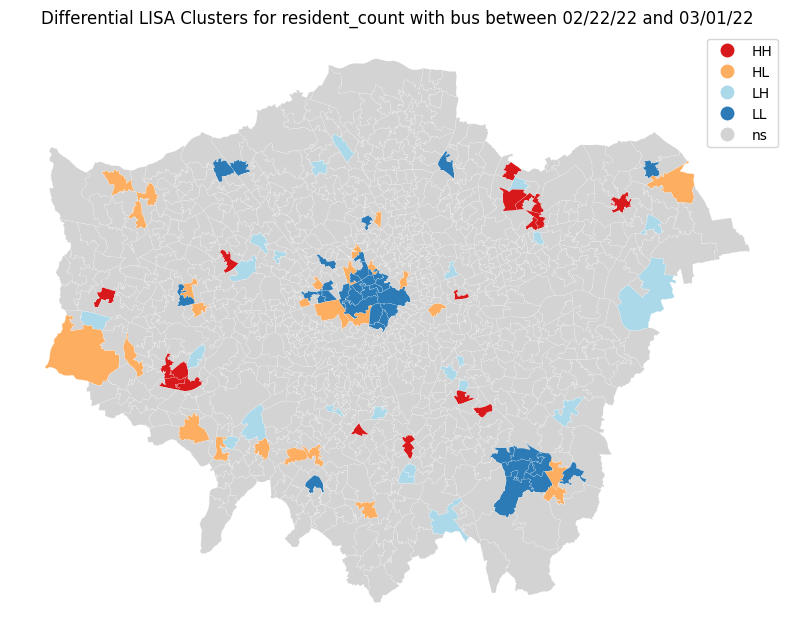

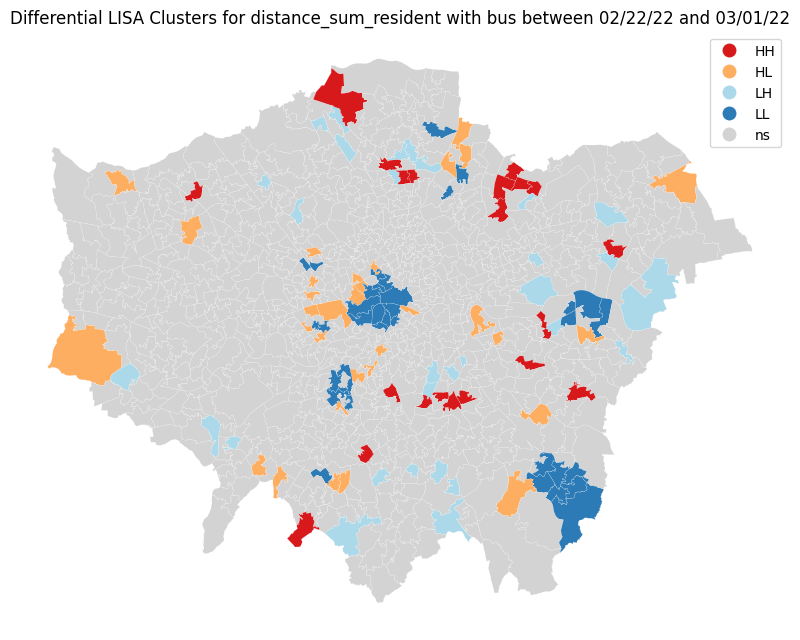

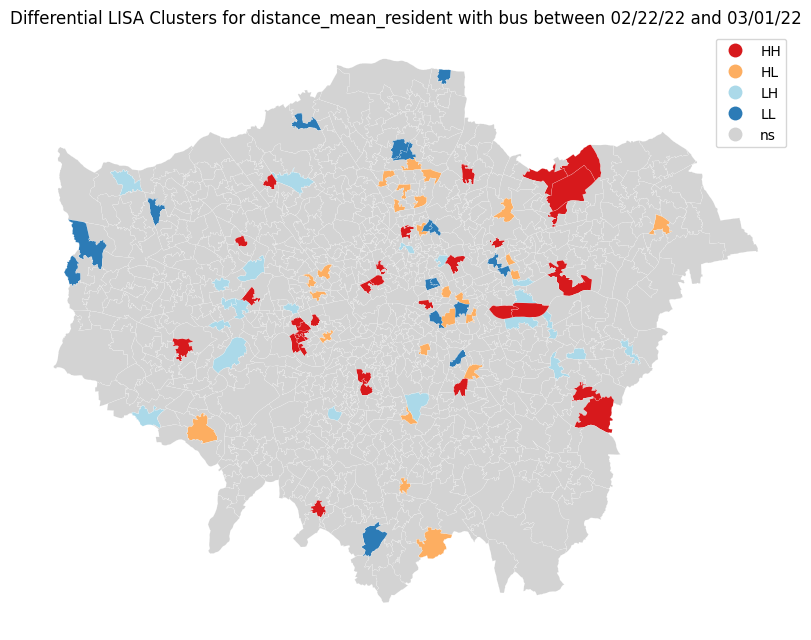

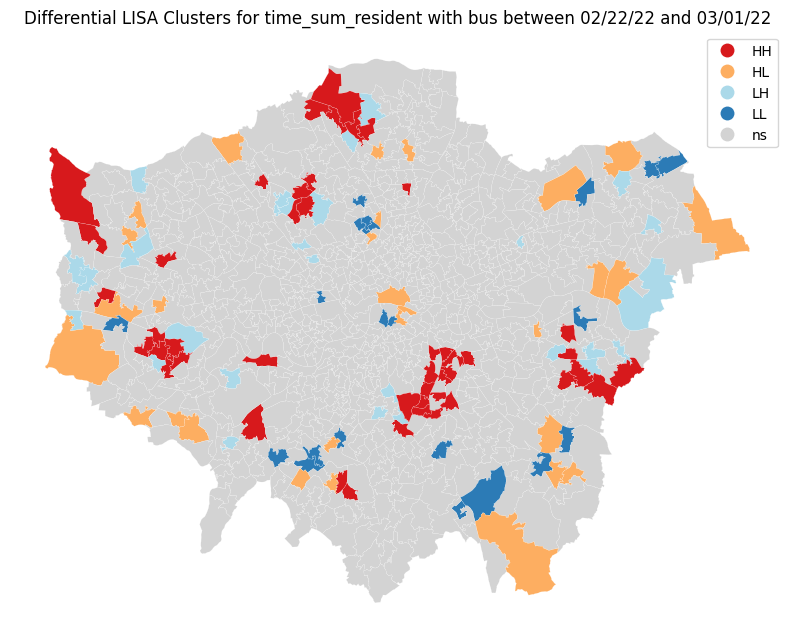

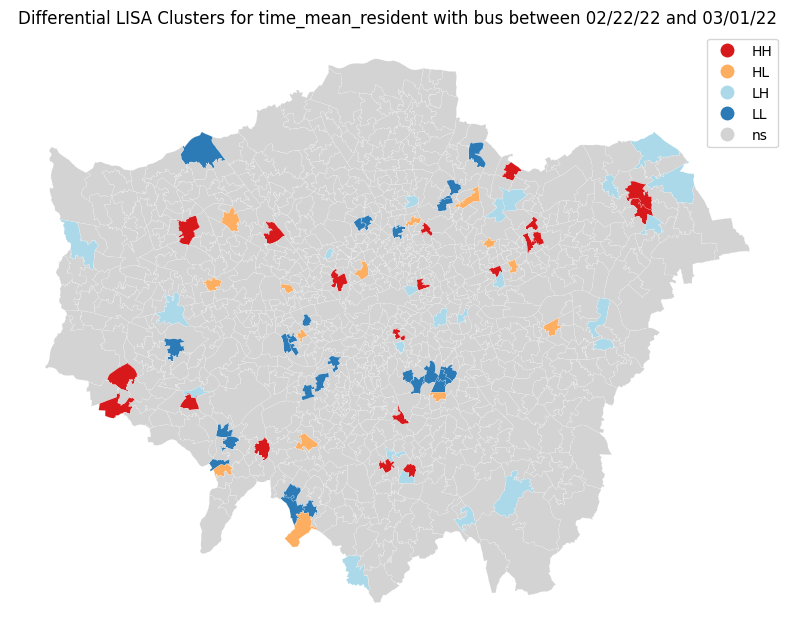

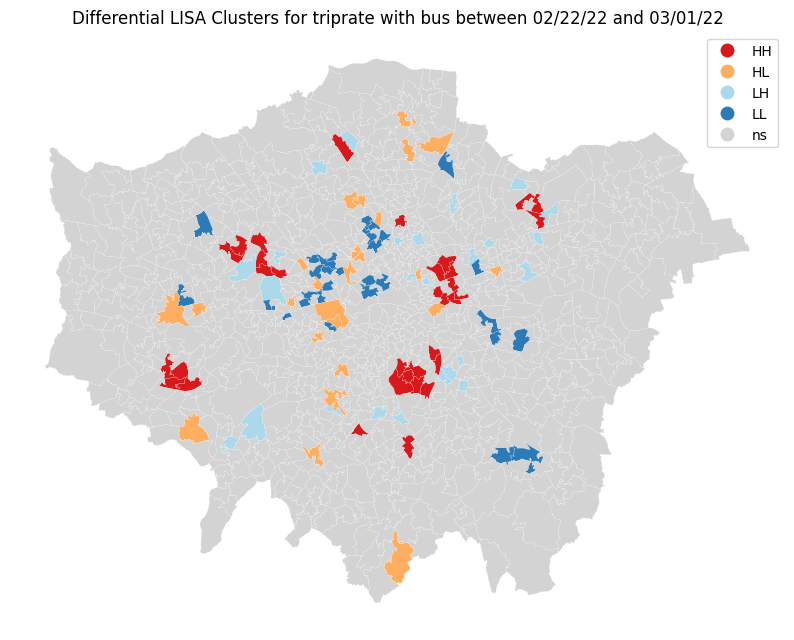

Processing update modes:  14%|█▍        | 1/7 [00:23<02:23, 23.85s/it]

[(2, 6), (3, 21), (4, 126), (5, 257), (6, 289), (7, 180), (8, 89), (9, 20), (10, 6), (11, 4), (12, 2), (13, 2)]
No islands in the spatial weights matrix.
Neighbor Counts Summary:
count    1002.000000
mean        5.892216
std         1.454044
min         2.000000
25%         5.000000
50%         6.000000
75%         7.000000
max        13.000000
dtype: float64
Processing car between 02/22/22 and 03/01/22...


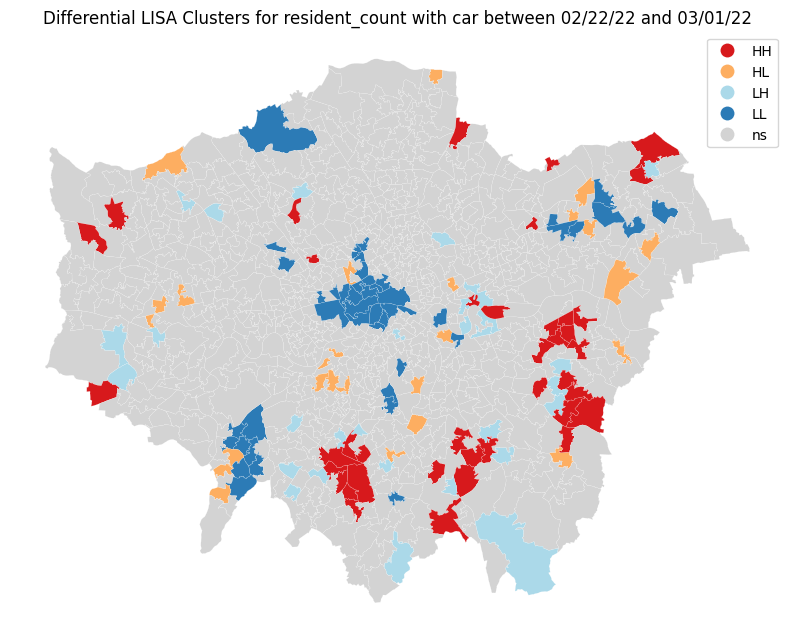

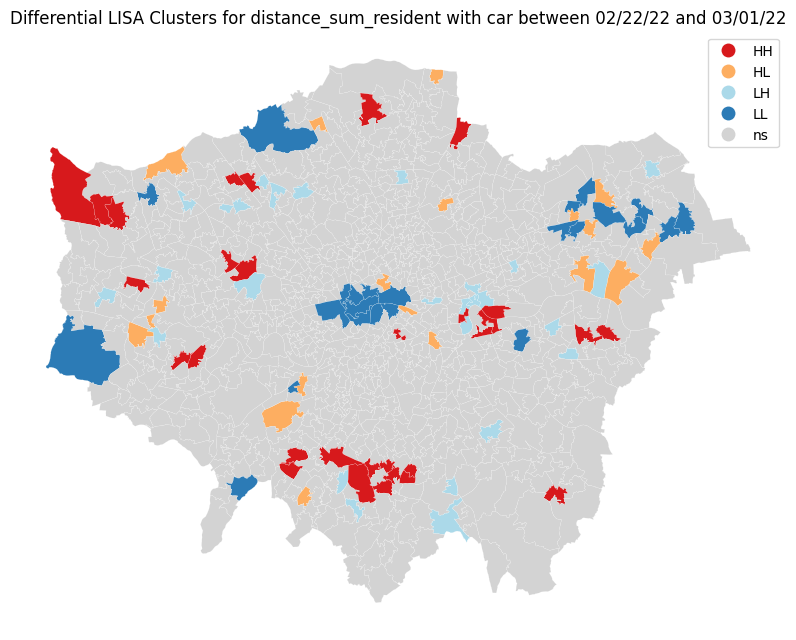

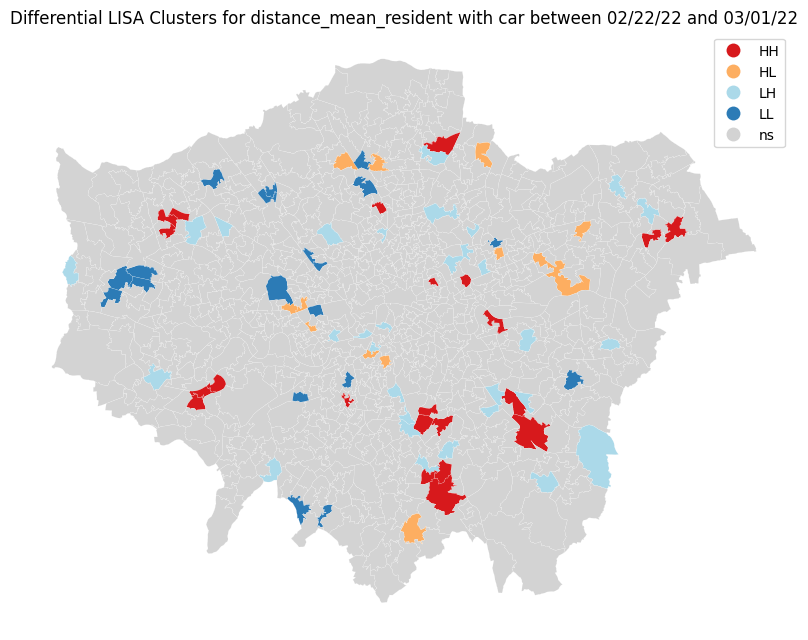

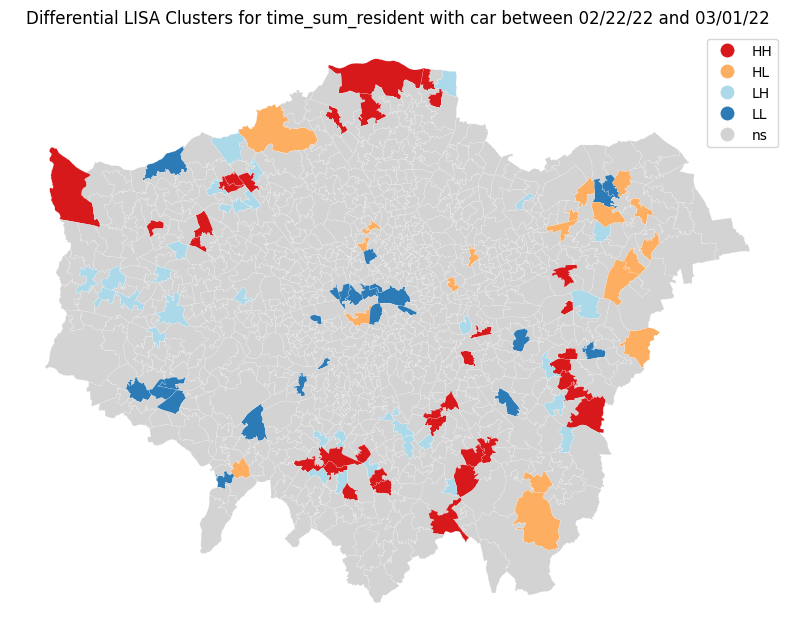

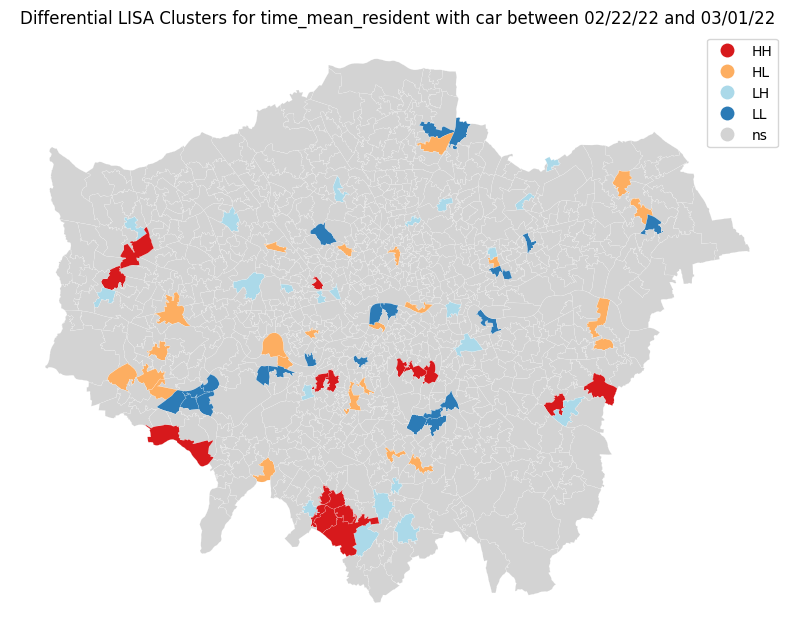

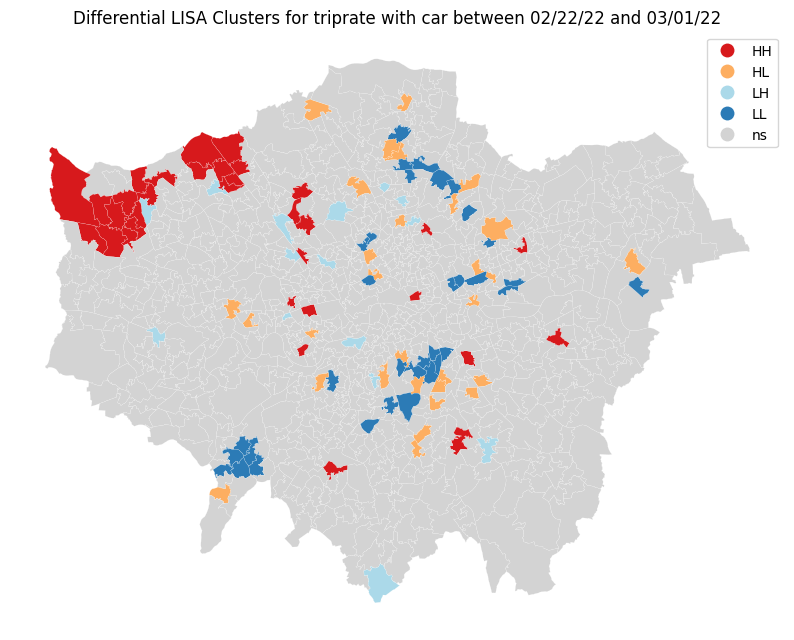

Processing update modes:  29%|██▊       | 2/7 [00:46<01:56, 23.26s/it]

[(2, 6), (3, 21), (4, 126), (5, 257), (6, 289), (7, 180), (8, 89), (9, 20), (10, 6), (11, 4), (12, 2), (13, 2)]
No islands in the spatial weights matrix.
Neighbor Counts Summary:
count    1002.000000
mean        5.892216
std         1.454044
min         2.000000
25%         5.000000
50%         6.000000
75%         7.000000
max        13.000000
dtype: float64
Processing cycle between 02/22/22 and 03/01/22...


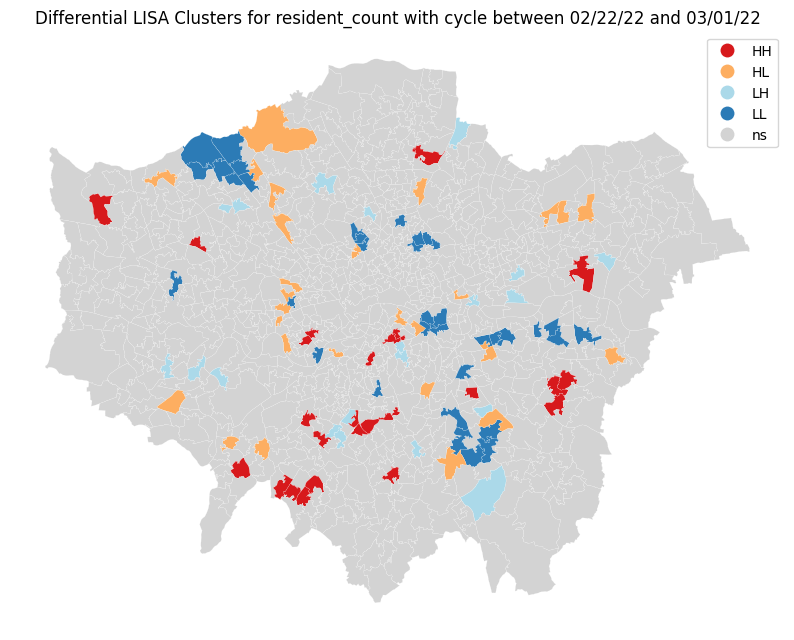

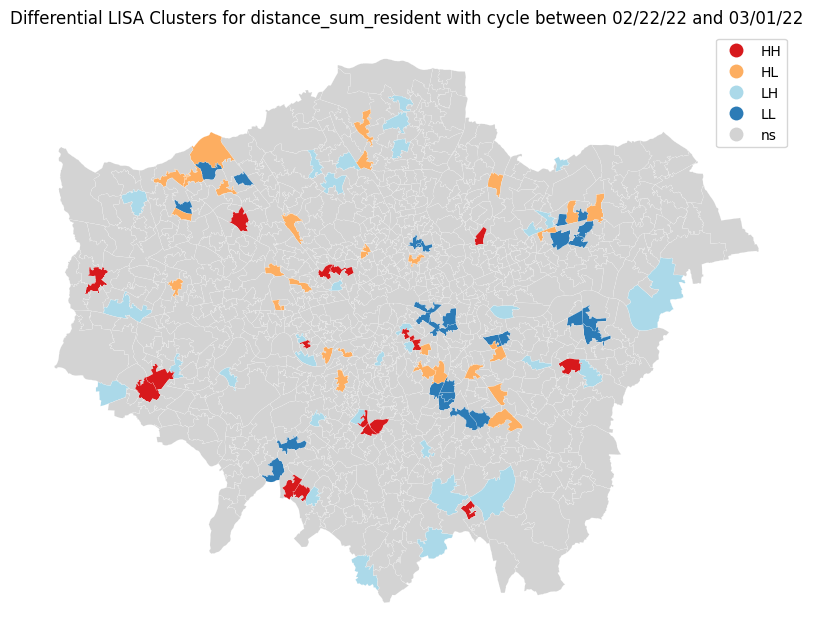

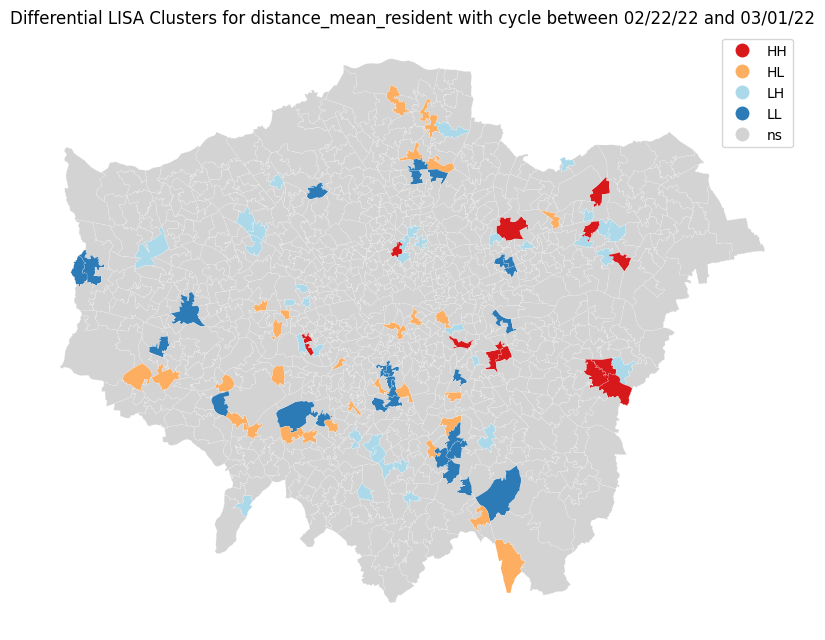

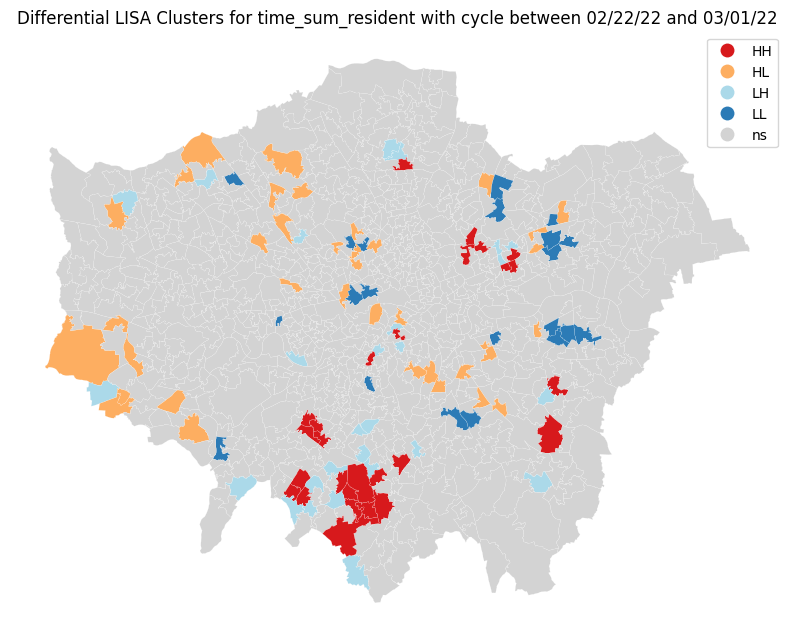

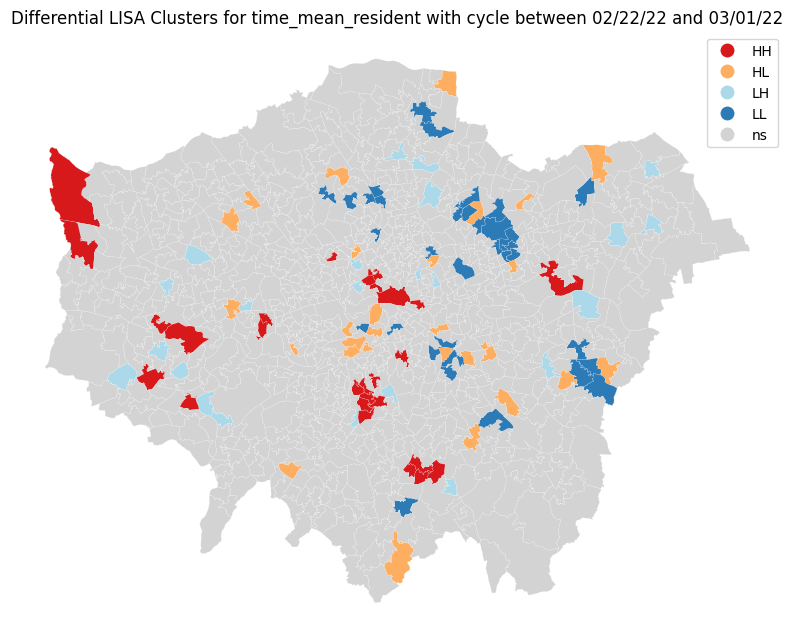

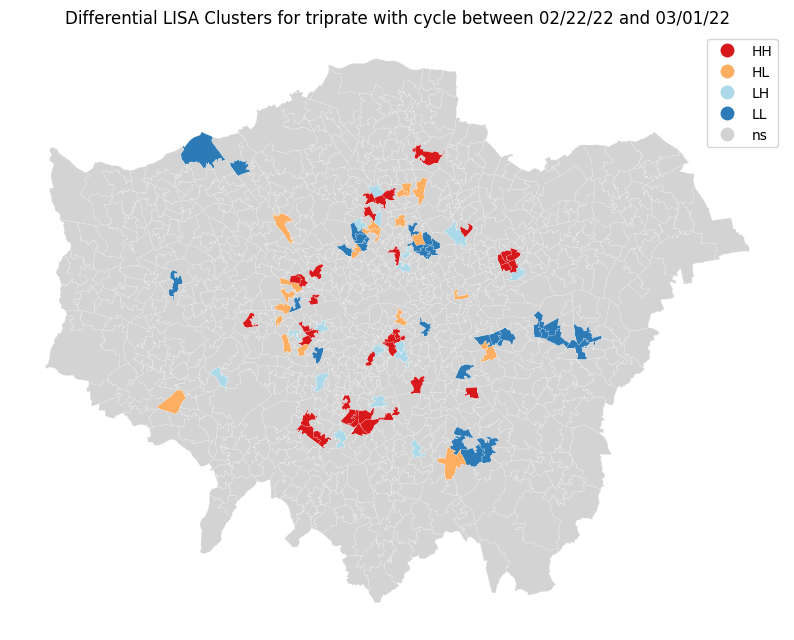

Processing update modes:  43%|████▎     | 3/7 [01:09<01:32, 23.09s/it]

[(2, 6), (3, 21), (4, 126), (5, 257), (6, 289), (7, 180), (8, 89), (9, 20), (10, 6), (11, 4), (12, 2), (13, 2)]
No islands in the spatial weights matrix.
Neighbor Counts Summary:
count    1002.000000
mean        5.892216
std         1.454044
min         2.000000
25%         5.000000
50%         6.000000
75%         7.000000
max        13.000000
dtype: float64
Processing stationary between 02/22/22 and 03/01/22...


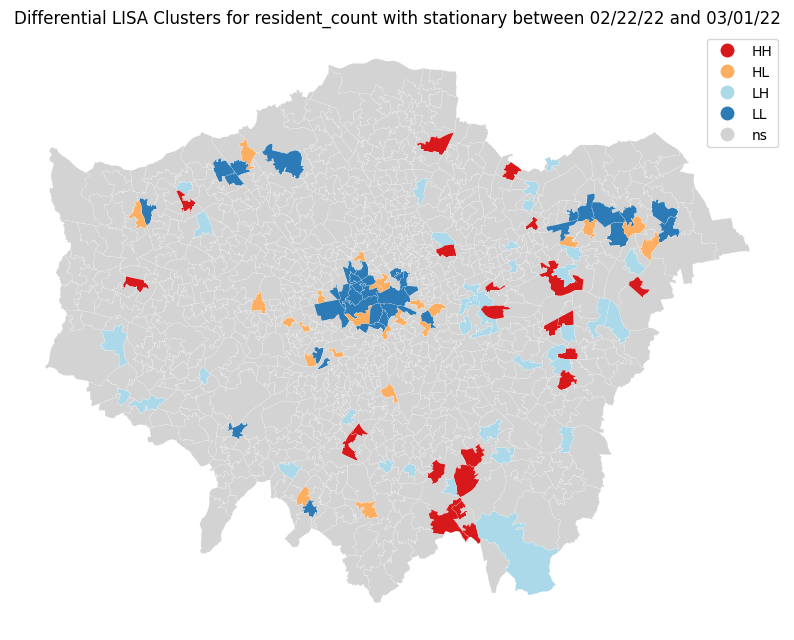

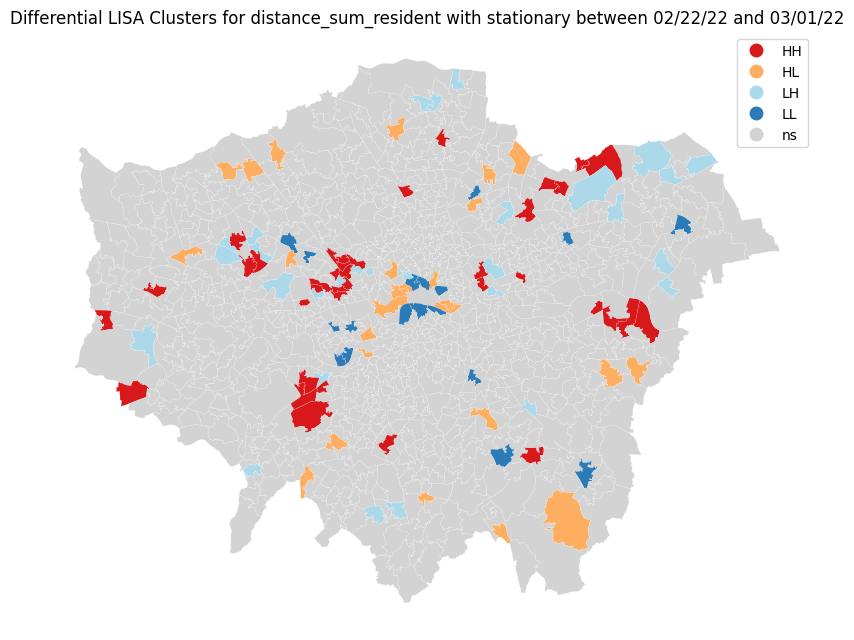

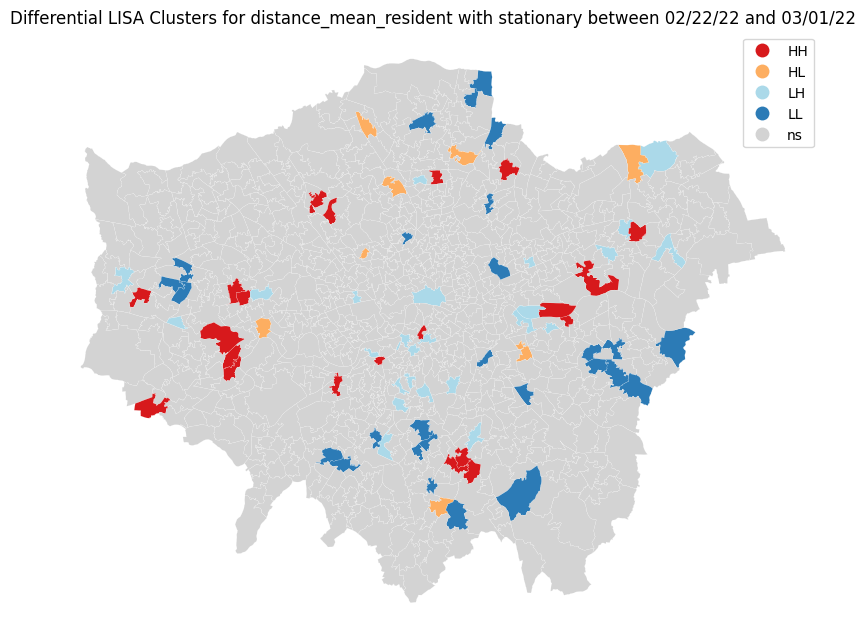

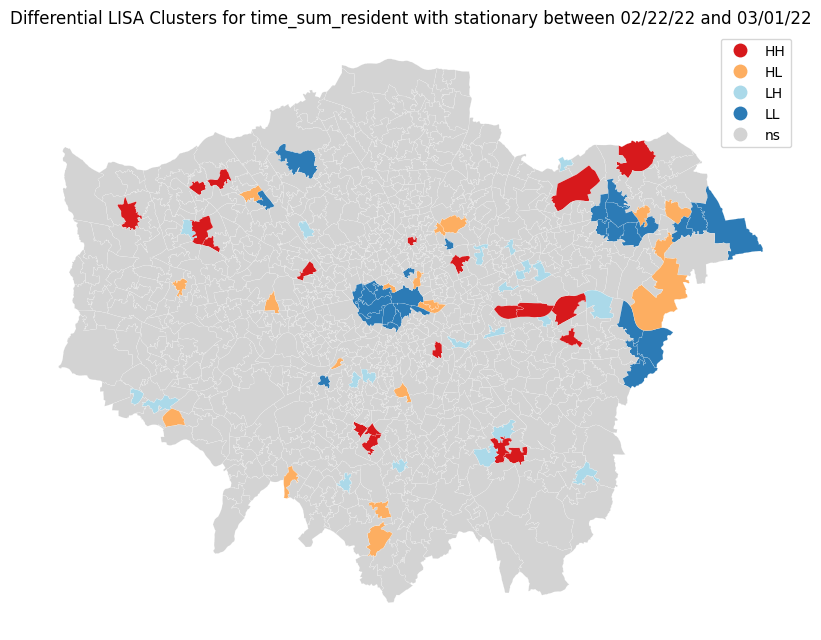

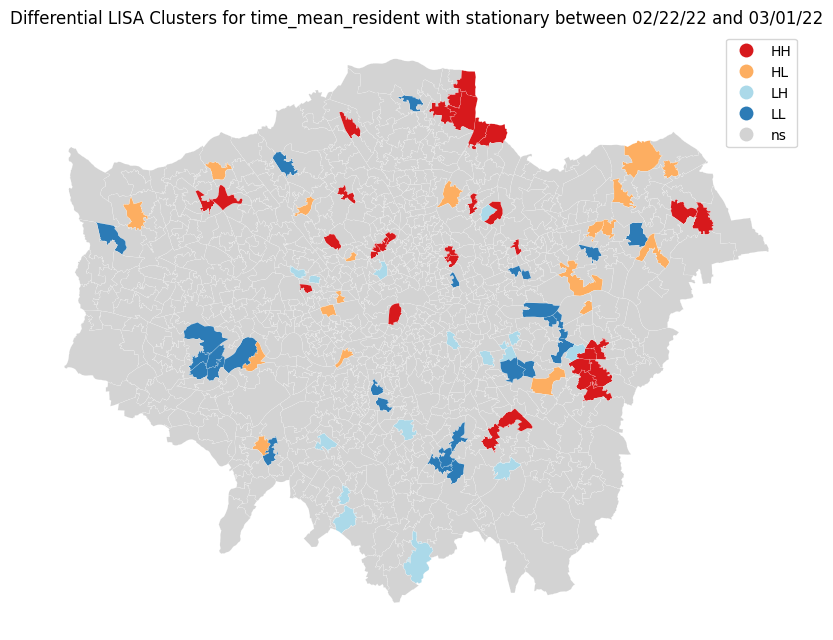

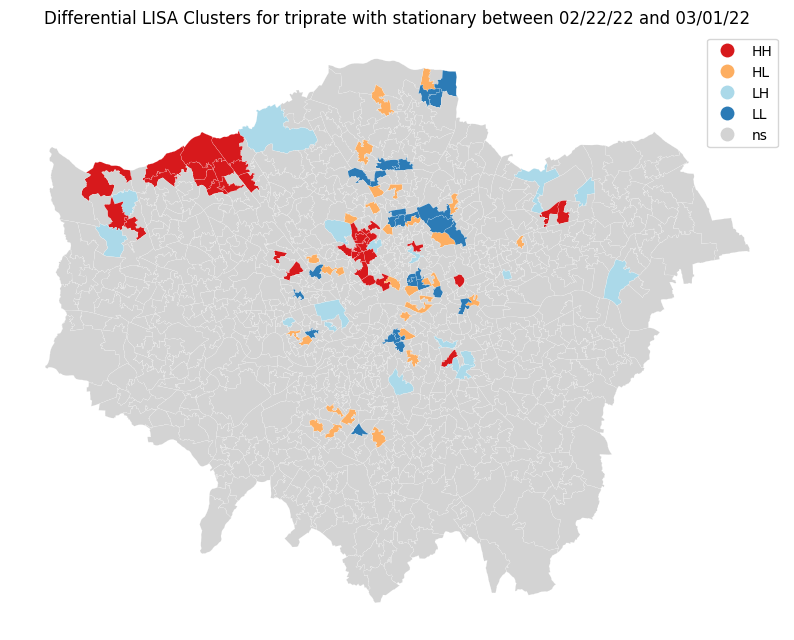

Processing update modes:  57%|█████▋    | 4/7 [01:32<01:09, 23.17s/it]

[(2, 6), (3, 21), (4, 126), (5, 257), (6, 289), (7, 180), (8, 89), (9, 20), (10, 6), (11, 4), (12, 2), (13, 2)]
No islands in the spatial weights matrix.
Neighbor Counts Summary:
count    1002.000000
mean        5.892216
std         1.454044
min         2.000000
25%         5.000000
50%         6.000000
75%         7.000000
max        13.000000
dtype: float64
Processing train between 02/22/22 and 03/01/22...


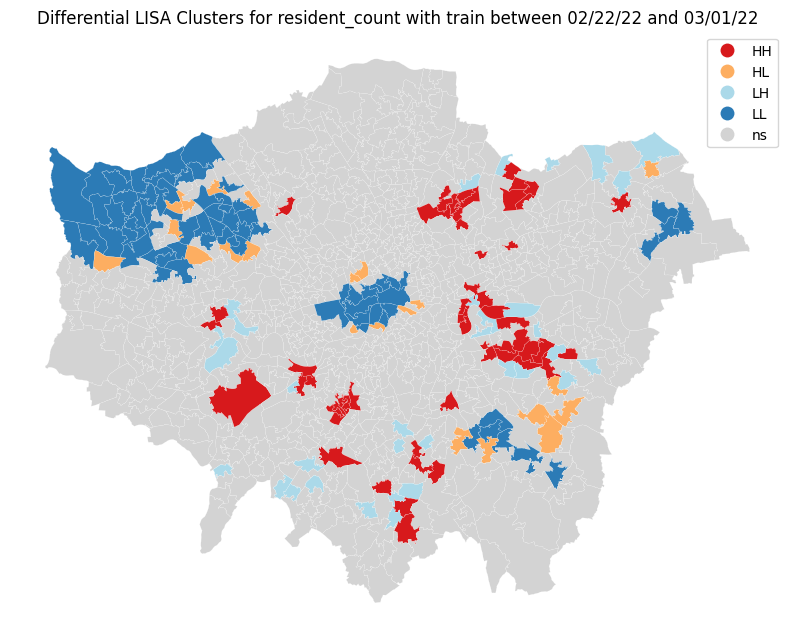

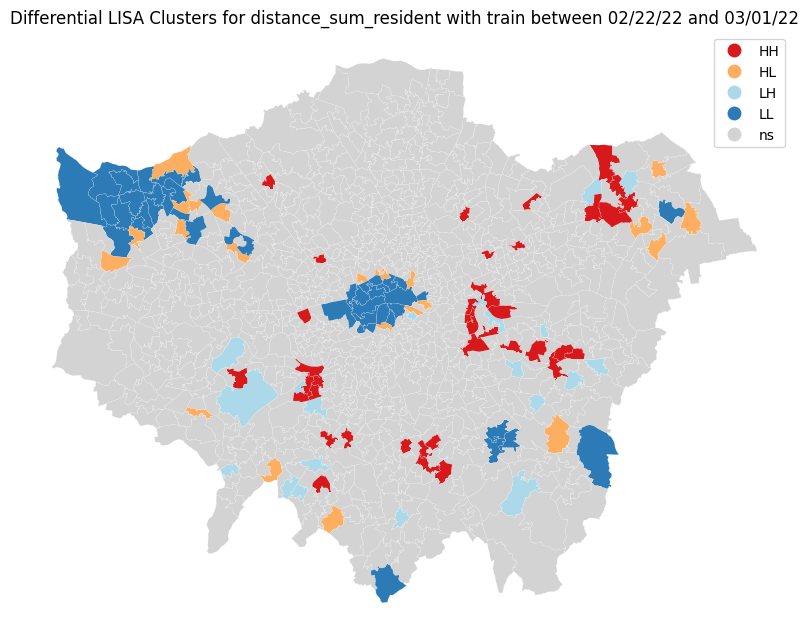

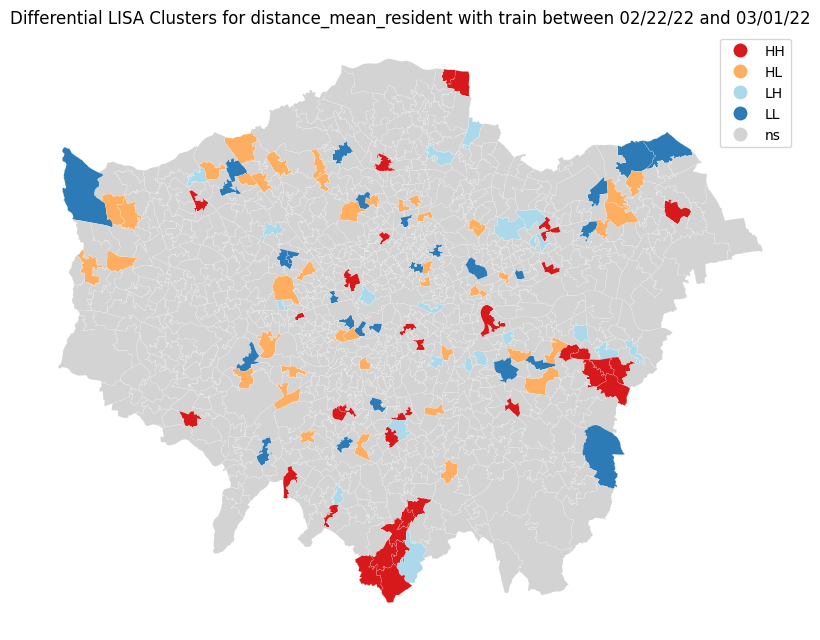

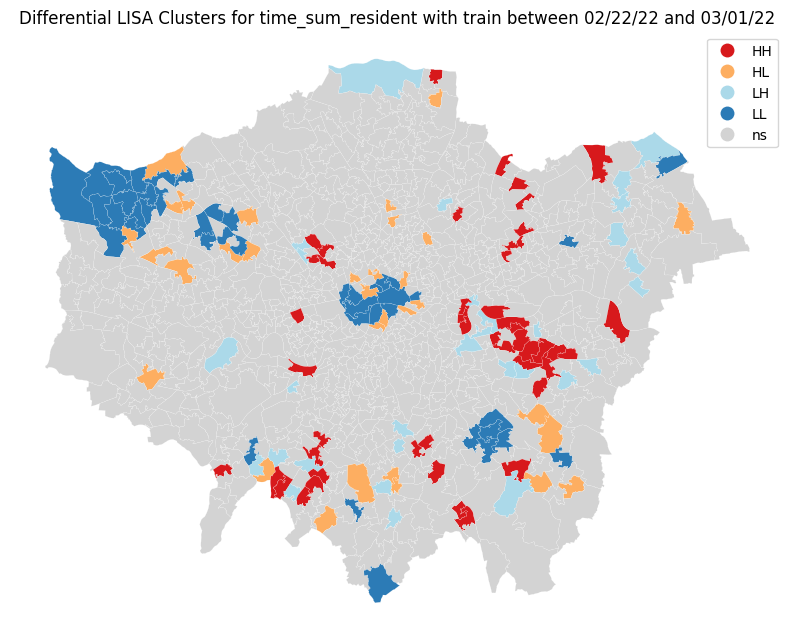

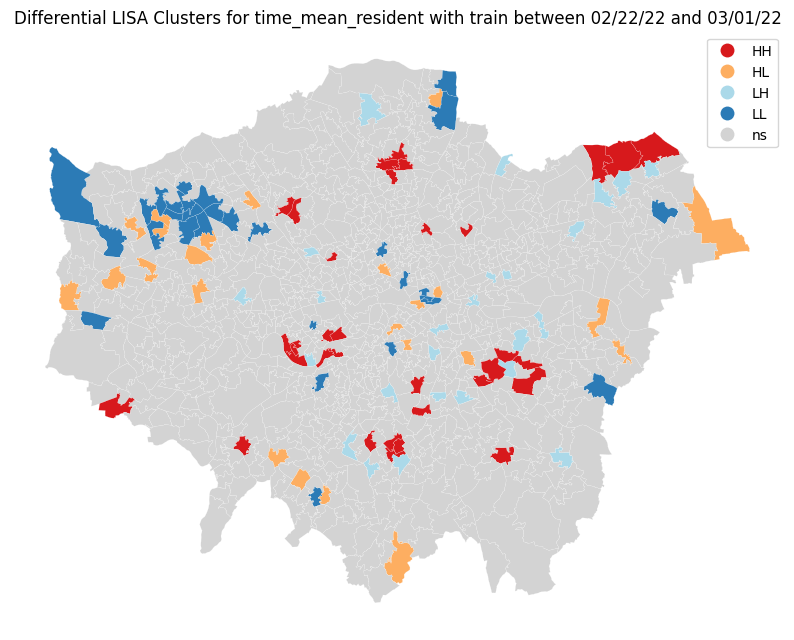

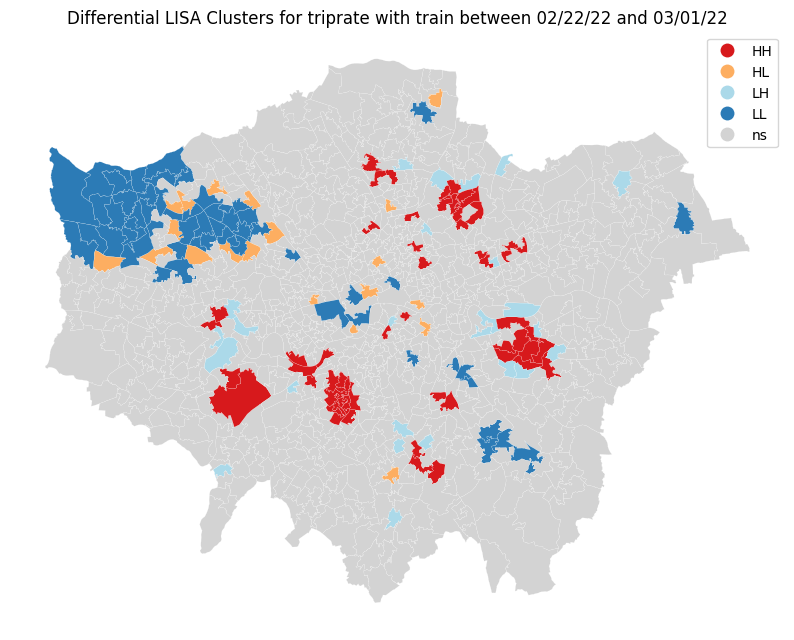

Processing update modes:  71%|███████▏  | 5/7 [01:55<00:46, 23.03s/it]

[(2, 6), (3, 21), (4, 126), (5, 257), (6, 289), (7, 180), (8, 89), (9, 20), (10, 6), (11, 4), (12, 2), (13, 2)]
No islands in the spatial weights matrix.
Neighbor Counts Summary:
count    1002.000000
mean        5.892216
std         1.454044
min         2.000000
25%         5.000000
50%         6.000000
75%         7.000000
max        13.000000
dtype: float64
Processing tube between 02/22/22 and 03/01/22...


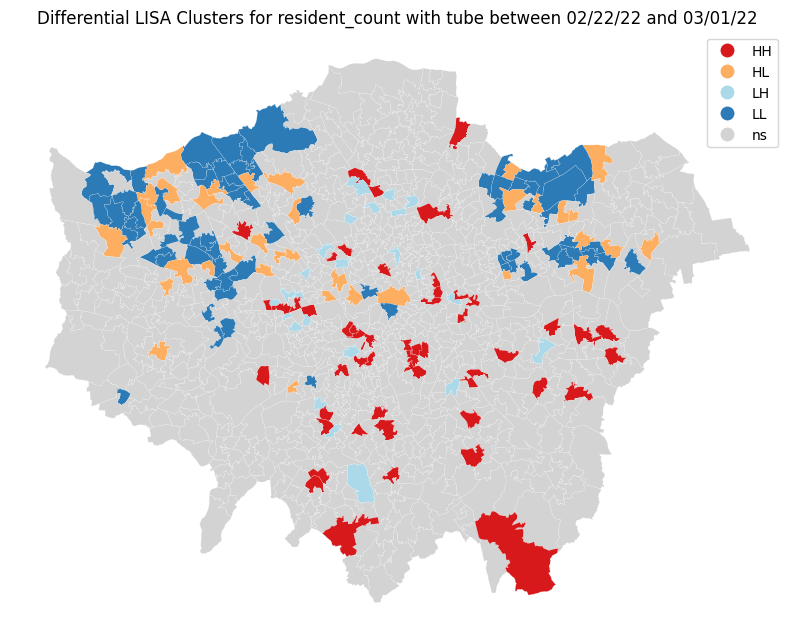

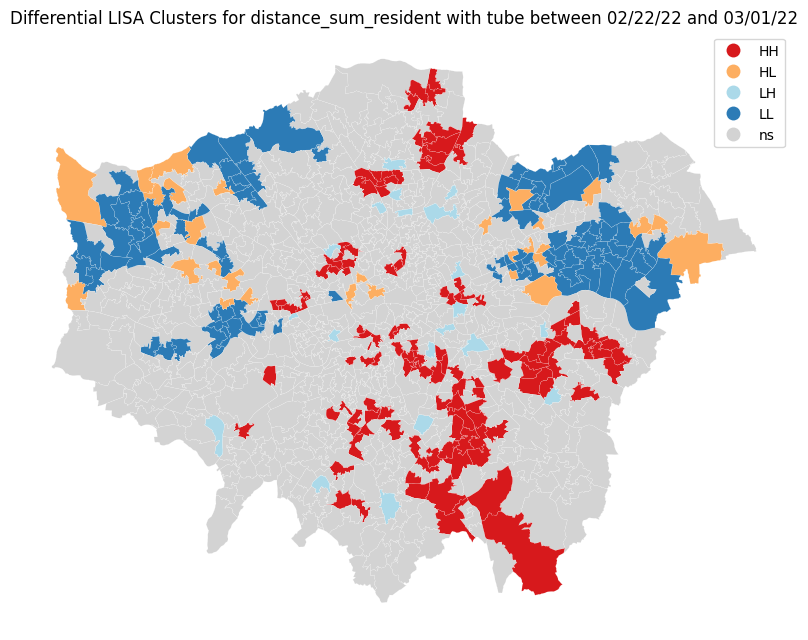

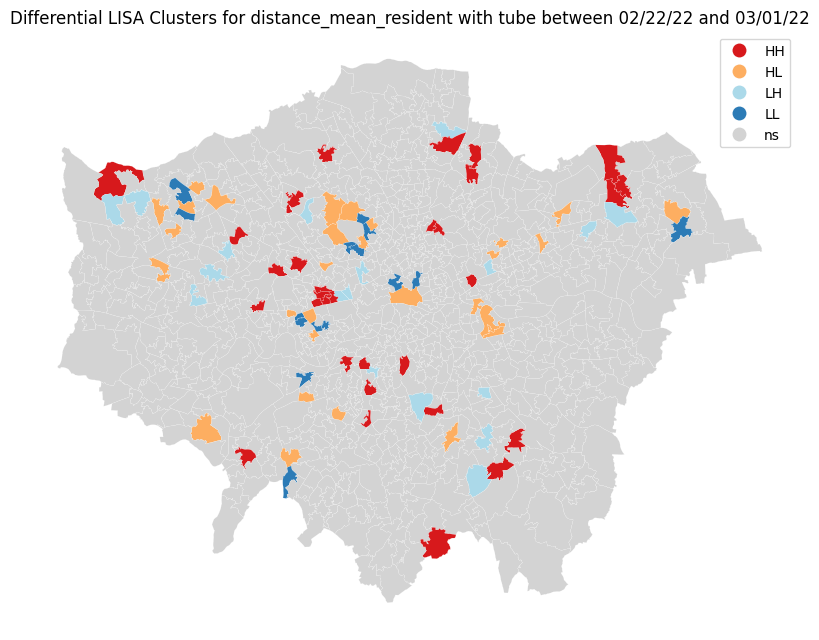

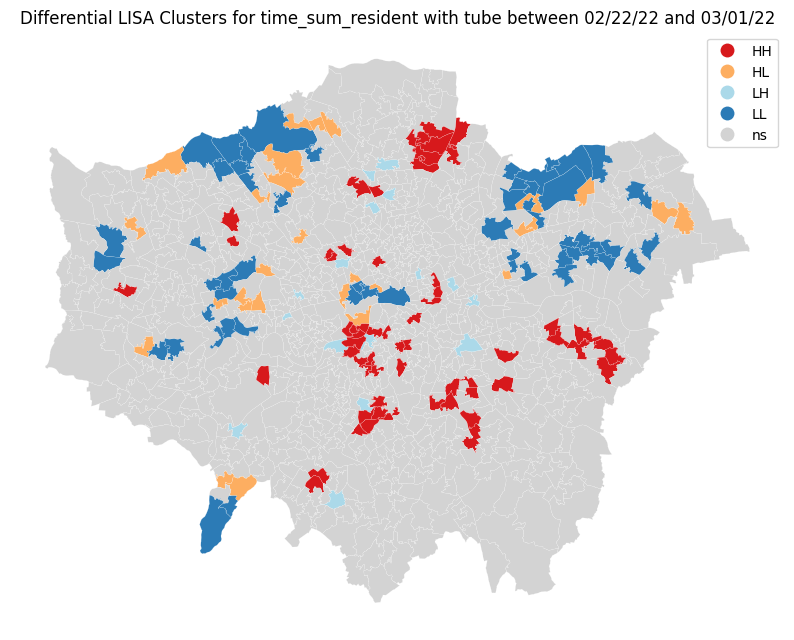

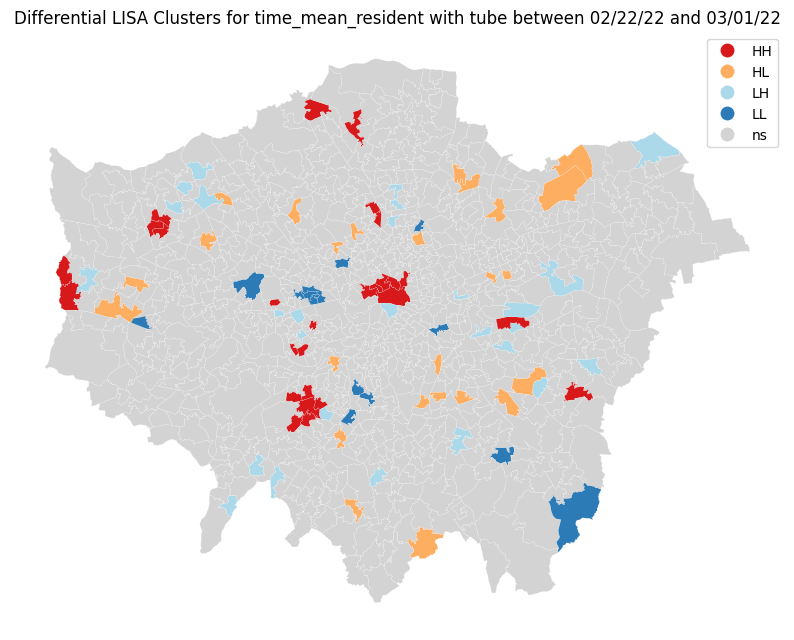

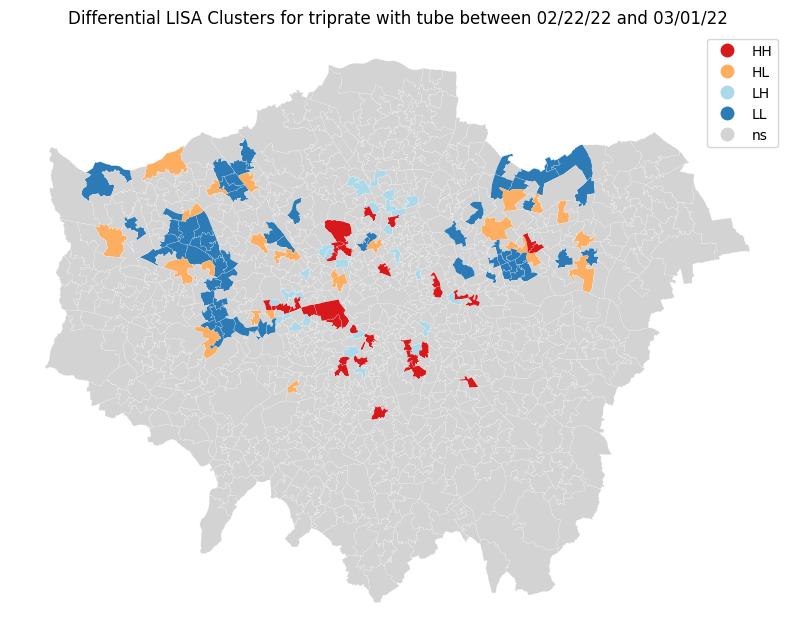

Processing update modes:  86%|████████▌ | 6/7 [02:19<00:23, 23.32s/it]

[(2, 6), (3, 21), (4, 126), (5, 257), (6, 289), (7, 180), (8, 89), (9, 20), (10, 6), (11, 4), (12, 2), (13, 2)]
No islands in the spatial weights matrix.
Neighbor Counts Summary:
count    1002.000000
mean        5.892216
std         1.454044
min         2.000000
25%         5.000000
50%         6.000000
75%         7.000000
max        13.000000
dtype: float64
Processing walks between 02/22/22 and 03/01/22...


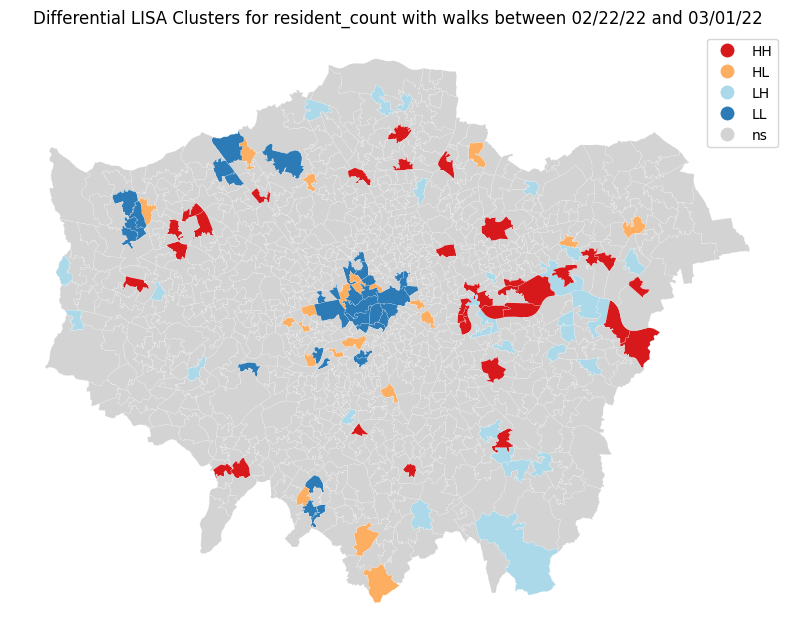

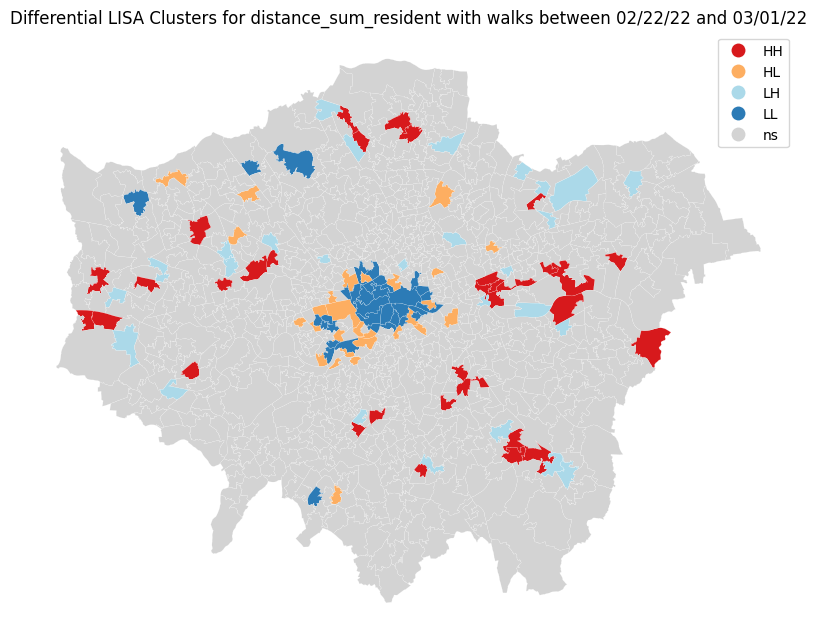

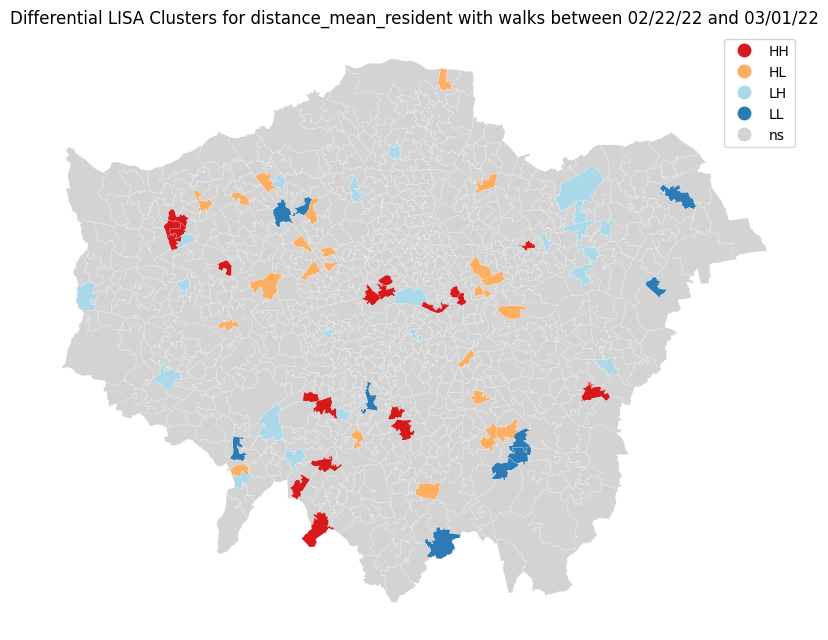

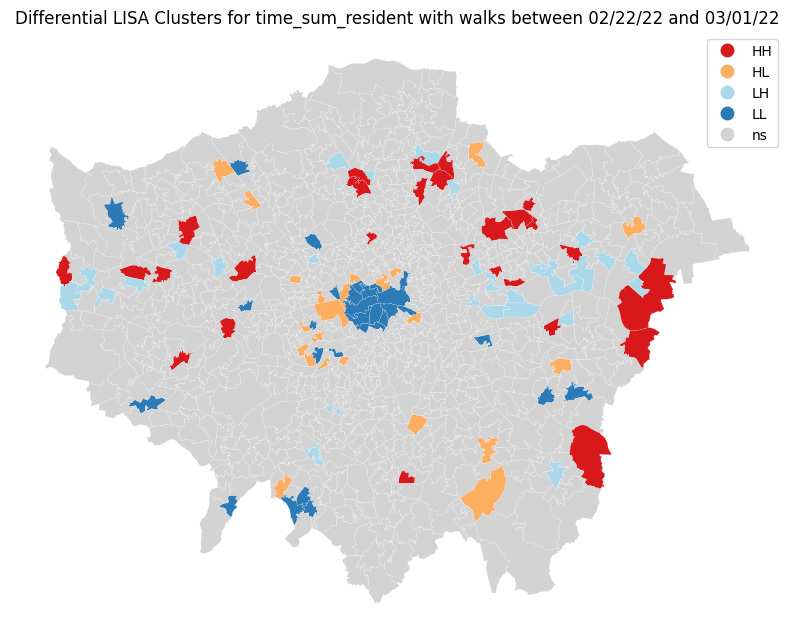

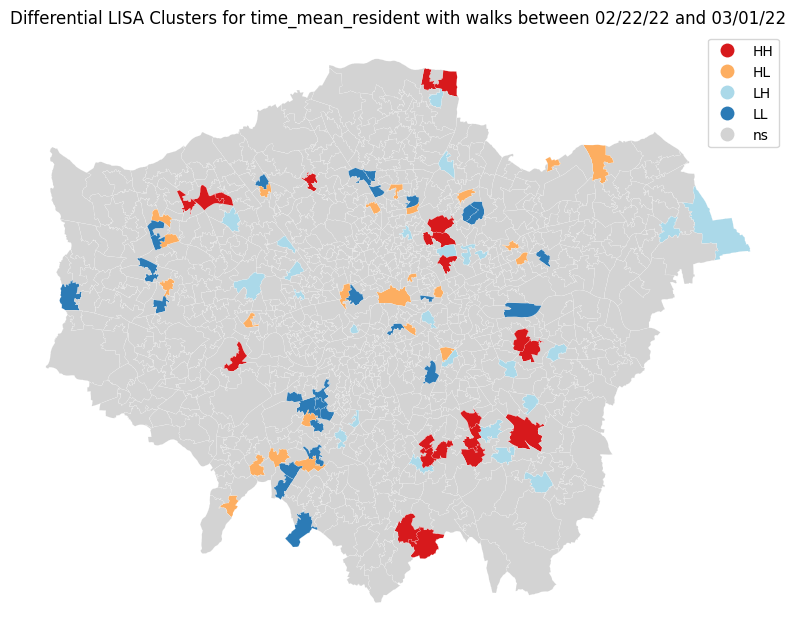

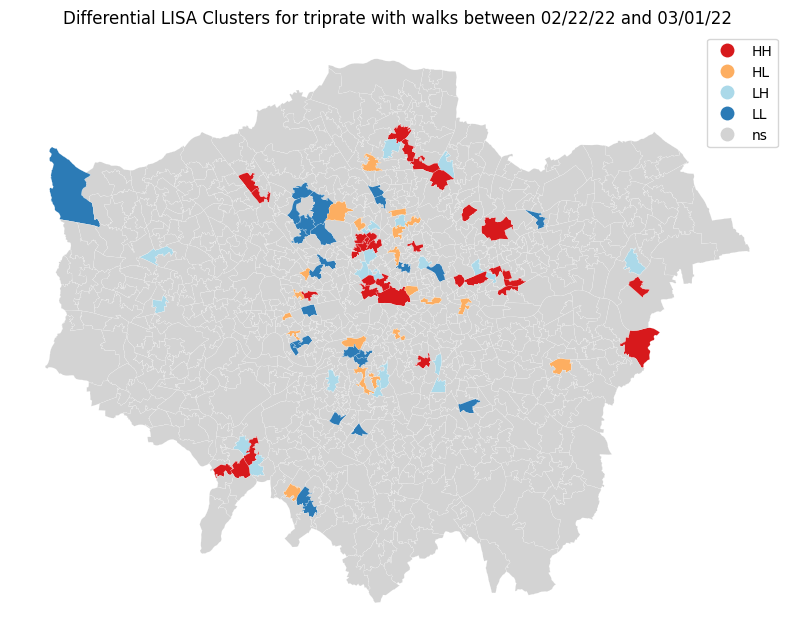

Processing update modes: 100%|██████████| 7/7 [02:42<00:00, 23.19s/it]

        msoa21cd        variable update_mode     date1     date2  \
0      E02000001  resident_count         bus  02/22/22  03/01/22   
1      E02000002  resident_count         bus  02/22/22  03/01/22   
2      E02000003  resident_count         bus  02/22/22  03/01/22   
3      E02000004  resident_count         bus  02/22/22  03/01/22   
4      E02000005  resident_count         bus  02/22/22  03/01/22   
...          ...             ...         ...       ...       ...   
42079  E02007111        triprate       walks  02/22/22  03/01/22   
42080  E02007112        triprate       walks  02/22/22  03/01/22   
42081  E02007113        triprate       walks  02/22/22  03/01/22   
42082  E02007114        triprate       walks  02/22/22  03/01/22   
42083  E02007115        triprate       walks  02/22/22  03/01/22   

       Moran_Local_I  Quadrant  p_value  
0           0.321994         3    0.002  
1           0.273258         3    0.204  
2           0.187841         3    0.180  
3          -0.3

In [224]:
import libpysal as lps
from splot.esda import lisa_cluster
import esda
import warnings
from shapely.errors import ShapelyDeprecationWarning
from tqdm import tqdm
from esda.moran import Moran

warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=ShapelyDeprecationWarning)

# Assuming map_msoa is your GeoDataFrame
gdf = map_msoa.copy()

gdf = gdf.explode(index_parts=True).reset_index(drop=True)

variables = [
    # 'attraction_count', 'passthrough_count', 
    'resident_count', 'distance_sum_resident', 'distance_mean_resident', 'time_sum_resident', 'time_mean_resident',
    'triprate']

dupulicates = gdf[gdf.duplicated(subset=['msoa21cd', 'date', 'update_mode'], keep=False)]
dupulicates


# Get unique dates and ensure they are sorted
unique_dates = sorted(gdf['date'].unique())[:2]
lisa_results = pd.DataFrame()

# Loop through each pair of consecutive dates
for i in range(len(unique_dates) - 1):
    date1, date2 = unique_dates[i], unique_dates[i + 1]

    # Get unique update modes
    update_modes = gdf['update_mode'].unique()

    # Loop through each update mode
    for update_mode in tqdm(update_modes, desc='Processing update modes'):
        # Filter the GeoDataFrame for the two dates and current update mode
        gdf_date1 = gdf[(gdf['date'] == date1) & (gdf['update_mode'] == update_mode)]
        gdf_date2 = gdf[(gdf['date'] == date2) & (gdf['update_mode'] == update_mode)]

        gdf_date1.reset_index(drop=True, inplace=True)
        gdf_date2.reset_index(drop=True, inplace=True)

        if not gdf_date1.empty and not gdf_date2.empty:

            # Create a spatial weights matrix based on the first date's GeoDataFrame
            w = lps.weights.Queen.from_dataframe(gdf_date1)
            w.transform = 'R'

            print(w.histogram)

            islands = w.islands
            if islands:
                print("Islands found:", islands)
            else:
                print("No islands in the spatial weights matrix.")

            neighbor_counts = [len(w.neighbors[i]) for i in w.neighbors]
            print("Neighbor Counts Summary:")
            print(pd.Series(neighbor_counts).describe())

            print(f"Processing {update_mode} between {date1} and {date2}...")

            # Loop through each variable
            for variable in variables:
                if variable in gdf_date1.columns and variable in gdf_date2.columns:
                    # Ensure the indices are the same before subtraction
                    gdf_date1 = gdf_date1.set_index('msoa21cd', drop=False)
                    gdf_date2 = gdf_date2.set_index('msoa21cd', drop=False)

                    # Calculate differences for the variable
                    diff = gdf_date2[variable] - gdf_date1[variable]

                    # Check for variation in differences
                    if diff.nunique() > 1 and not diff.isna().all():
                        # Recreate the spatial weights matrix for the filtered GeoDataFrame
                        w = lps.weights.Queen.from_dataframe(gdf_date1)
                        w.transform = 'R'

                        # Ensure diff.values matches the order of gdf_date1 used in w
                        lisa_diff = esda.Moran_Local(diff.values, w)

                        # Create a temporary DataFrame with the results
                        temp_df = pd.DataFrame({
                            'msoa21cd': gdf_date1.index,
                            'variable': variable,
                            'update_mode': update_mode,
                            'date1': date1,
                            'date2': date2,
                            'Moran_Local_I': lisa_diff.Is,
                            'Quadrant': lisa_diff.q,
                            'p_value': lisa_diff.p_sim
                        })

                        # Append the temporary DataFrame to the main results DataFrame
                        lisa_results = pd.concat([lisa_results, temp_df], ignore_index=True)

                        # Plot LISA clusters for the differences
                        fig, ax = plt.subplots(figsize=(10, 10))
                        gdf_date1['diff'] = diff.values  # Temporarily store differences for plotting
                        lisa_cluster(lisa_diff, gdf_date1, ax=ax, p=0.05)
                        ax.set_title(
                            f"Differential LISA Clusters for {variable} with {update_mode} between {date1} and {date2}")
                        plt.show()
                        gdf_date1.drop(columns=['diff'], inplace=True)  # Clean up
                    else:
                        print(
                            f"Skipping {variable} with {update_mode} between {date1} and {date2} due to insufficient unique values or all NaN values.")
                else:
                    print(f"Variable {variable} not found in one of the dates for update_mode {update_mode}.")
        else:
            print(f"Skipping {update_mode} between {date1} and {date2} due to empty data.")

# Show the results
print(lisa_results)


In [227]:
lisa_results

,msoa21cd,variable,update_mode,date1,date2,Moran_Local_I,Quadrant,p_value
0,E02000001,resident_count,bus,02/22/22,03/01/22,0.321994,3,0.002
1,E02000002,resident_count,bus,02/22/22,03/01/22,0.273258,3,0.204
2,E02000003,resident_count,bus,02/22/22,03/01/22,0.187841,3,0.180
3,E02000004,resident_count,bus,02/22/22,03/01/22,-0.331819,4,0.155
4,E02000005,resident_count,bus,02/22/22,03/01/22,-0.722625,4,0.092
...,...,...,...,...,...,...,...,...
42079,E02007111,triprate,walks,02/22/22,03/01/22,0.033088,3,0.441
42080,E02007112,triprate,walks,02/22/22,03/01/22,0.003979,3,0.496
42081,E02007113,triprate,walks,02/22/22,03/01/22,-0.444257,4,0.040
42082,E02007114,triprate,walks,02/22/22,03/01/22,-0.563065,2,0.111


In [240]:
lisa = lisa_results.copy()

lisa['Quadrant'] = lisa['Quadrant'].map({1: 'HH', 2: 'LH', 3: 'LL', 4: 'HL'})

lisa_moran = lisa.pivot(index=['msoa21cd', 'update_mode', 'date1', 'date2'], columns='variable',
                  values='Moran_Local_I').reset_index().rename_axis(None, axis=1)

lisa_Quadrant = lisa.pivot(index=['msoa21cd', 'update_mode', 'date1', 'date2'], columns='variable',
                  values='Quadrant').reset_index().rename_axis(None, axis=1)


print(lisa_moran.columns)
print(lisa_Quadrant.columns)
lisa_Quadrant

Index(['msoa21cd', 'update_mode', 'date1', 'date2', 'distance_mean_resident',
       'distance_sum_resident', 'resident_count', 'time_mean_resident',
       'time_sum_resident', 'triprate'],
      dtype='object')
Index(['msoa21cd', 'update_mode', 'date1', 'date2', 'distance_mean_resident',
       'distance_sum_resident', 'resident_count', 'time_mean_resident',
       'time_sum_resident', 'triprate'],
      dtype='object')


,msoa21cd,update_mode,date1,date2,distance_mean_resident,distance_sum_resident,resident_count,time_mean_resident,time_sum_resident,triprate
0,E02000001,bus,02/22/22,03/01/22,HH,LL,LL,LL,HL,HL
1,E02000001,car,02/22/22,03/01/22,HH,LL,LL,LL,LL,LL
2,E02000001,cycle,02/22/22,03/01/22,LL,LL,HL,HH,LL,LH
3,E02000001,stationary,02/22/22,03/01/22,LH,LL,LL,HL,LL,LH
4,E02000001,train,02/22/22,03/01/22,HL,LL,LL,HL,LL,LL
...,...,...,...,...,...,...,...,...,...,...
7009,E02007115,cycle,02/22/22,03/01/22,LL,HL,LL,HH,LL,LL
7010,E02007115,stationary,02/22/22,03/01/22,LH,HL,LL,HL,LH,HH
7011,E02007115,train,02/22/22,03/01/22,HH,LL,LL,HL,LL,LL
7012,E02007115,tube,02/22/22,03/01/22,LL,LL,LH,HH,LL,LH


In [241]:
print(msoa.columns)

Index(['msoa21cd', 'msoa21nm', 'area', 'lad21cd', 'lad21nm', 'geometry',
       'inout'],
      dtype='object')


# OD Graph